# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

AttributeError: module 'helper' has no attribute 'download_extract'

## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

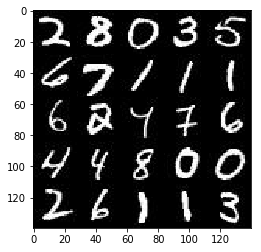

In [47]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

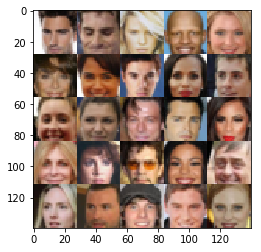

In [48]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [49]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [50]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name="input_real")
    input_z = tf.placeholder(tf.float32, [None, z_dim], name='input_z')
    learning_rate = tf.placeholder(tf.float32, None, name='learning_rate')

    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/usr/local/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/usr/local/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/usr/local/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/usr/local/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 477, in start\n    ioloop.IOLoop.instance().start()', 'File "/usr/local/lib/python3.6/site-packages/zmq/eventloop/ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'F

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [51]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    
    keep_prob = .9
    
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        
        # input 28 * 28 * 3
        x1 = tf.layers.conv2d(images, 64, 5, strides = 2, padding= 'same')
        relu1 = tf.maximum(.01 * x1, x1)
        
        ## 14 * 14 * 64
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training = True)
        relu2 = tf.maximum(bn2 * .1, bn2)
        drop2 = tf.nn.dropout(relu2, keep_prob=keep_prob)
    
        ## 7 * 7 * 128
        x3 = tf.layers.conv2d(drop2, 256, 5, strides=2, padding='valid')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(bn3, bn3 * .1)
        drop3 = tf.nn.dropout(relu3, keep_prob=keep_prob)

        
        ## 4 * 4 * 256
        x4 = tf.layers.conv2d(drop3, 512, 5, strides=2, padding='same')
        bn4 = tf.layers.batch_normalization(x4, training=True)
        relu4 = tf.maximum(bn4, bn4 * .1)
        drop4 = tf.nn.dropout(relu4, keep_prob=keep_prob)

        
        ## 2 * 2 * 512
        flat = tf.reshape(drop4, (-1, 2 * 2 * 512))
        logits = tf.layers.dense(flat, 1, activation= None)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [52]:
def generator(z, out_channel_dim, is_training=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    keep_prob = .9
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse= not is_training):
        
        x1 = tf.layers.dense(z, 3*3*1024)
        ## reshape
        
        x1 = tf.reshape(x1, (-1, 3, 3, 1024))
        x1 = tf.layers.batch_normalization(x1, training = is_training)
        x1 = tf.maximum(.1 * x1, x1)
        ## 4x4x512
        
        x2 = tf.layers.conv2d_transpose(x1, 512, 4, strides=1, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_training)
        x2 = tf.maximum(.1 * x2, x2)
        x2 = tf.nn.dropout(x2, keep_prob = keep_prob)
        ## 8 * 8 * 256
        
        x3 = tf.layers.conv2d_transpose(x2, 256, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_training)
        x3 = tf.maximum(.1 * x3, x3)
        x3 = tf.nn.dropout(x3, keep_prob = keep_prob)

        ## 16* 16 * 128
        
        x4 = tf.layers.conv2d_transpose(x3, 128, 4, strides=2, padding='valid')
        x4 = tf.layers.batch_normalization(x4, training=is_training)
        x4 = tf.maximum(.1 * x4, x4)
        x4 = tf.nn.dropout(x4, keep_prob = keep_prob)

        
        logits = tf.layers.conv2d_transpose(x4, out_channel_dim, 4, strides=2, padding = 'same')
        ## reshaped = tf.reshape(logits, (-1, 28, 28, out_channel_dim))
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [53]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                                         labels=tf.ones_like(d_model_real) * .9))
    
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                        labels=tf.zeros_like(d_model_fake)))
                                 
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                   labels=tf.ones_like(d_logits_fake)))
                                 
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [54]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    
    d_train_opt = tf.train.AdamOptimizer(learning_rate).minimize(d_loss, var_list = d_vars)
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='generator')): ##req. for batch normalization
        g_train_opt = tf.train.AdamOptimizer(learning_rate = learning_rate, beta1 = beta1).minimize(g_loss, var_list = g_vars)
    
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [55]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [56]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model    
    steps = 0
    show_every = 100
    channels = 1
    
    if data_image_mode == 'RGB':
        channels = 3           
    
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)

    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, lr, beta1)  
    
    saver = tf.train.Saver()
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps +=1
                            
                batch_images = batch_images * 2
                            
                # TODO: Train Model
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate })
                _ = sess.run(g_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate })
                
                _ = sess.run(g_train_opt, feed_dict= {input_z: batch_z, lr: learning_rate })
                
                if steps % show_every == 0: 
                    show_generator_output(sess, 25, input_z, channels, data_image_mode)
                    
                if steps % 10 == 0:
                    train_loss_d = sess.run(d_loss, { input_z: batch_z, input_real: batch_images, lr: learning_rate  })
                    train_loss_g = g_loss.eval({input_z: batch_z, lr: learning_rate })
                    saver.save(sess, './checkpoints/generator.ckpt')

                    
                    print("\n Epoch {}/{} Step {}".format(epoch_i + 1, epochs, steps),
                          "Discriminator Loss: {:.4f} ... ".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                
            train_loss_d = sess.run(d_loss, {input_z: batch_z, input_real: batch_images, lr: learning_rate })
            train_loss_g = g_loss.eval({input_z: batch_z, lr: learning_rate })

            print("\n Epoch {}/{}...".format(epoch_i+1, epochs),
                  "Discriminator Loss: {:.4f}...".format(train_loss_d),
                  "Generator Loss: {:.4f}".format(train_loss_g))
                    #show_generator_output(sess, 10, input_z, out_channel_dim, image_mode)

                    
                
                
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.


 Epoch 1/2 Step 10 Discriminator Loss: 11.7994 ...  Generator Loss: 0.0000

 Epoch 1/2 Step 20 Discriminator Loss: 9.8152 ...  Generator Loss: 0.0018

 Epoch 1/2 Step 30 Discriminator Loss: 8.6440 ...  Generator Loss: 0.0012

 Epoch 1/2 Step 40 Discriminator Loss: 7.7784 ...  Generator Loss: 0.0054

 Epoch 1/2 Step 50 Discriminator Loss: 7.7459 ...  Generator Loss: 0.0061

 Epoch 1/2 Step 60 Discriminator Loss: 6.6145 ...  Generator Loss: 0.0076

 Epoch 1/2 Step 70 Discriminator Loss: 6.2653 ...  Generator Loss: 0.0049

 Epoch 1/2 Step 80 Discriminator Loss: 5.9933 ...  Generator Loss: 0.0064

 Epoch 1/2 Step 90 Discriminator Loss: 5.7714 ...  Generator Loss: 0.0084


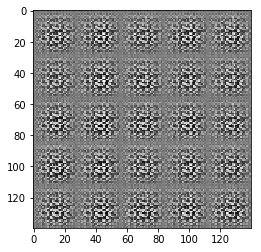


 Epoch 1/2 Step 100 Discriminator Loss: 5.7395 ...  Generator Loss: 0.0092

 Epoch 1/2 Step 110 Discriminator Loss: 5.3053 ...  Generator Loss: 0.0142

 Epoch 1/2 Step 120 Discriminator Loss: 5.7749 ...  Generator Loss: 0.0123

 Epoch 1/2 Step 130 Discriminator Loss: 5.6370 ...  Generator Loss: 0.0104

 Epoch 1/2 Step 140 Discriminator Loss: 5.7201 ...  Generator Loss: 0.0105

 Epoch 1/2 Step 150 Discriminator Loss: 5.7114 ...  Generator Loss: 0.0092

 Epoch 1/2 Step 160 Discriminator Loss: 5.3967 ...  Generator Loss: 0.0091

 Epoch 1/2 Step 170 Discriminator Loss: 5.0992 ...  Generator Loss: 0.0114

 Epoch 1/2 Step 180 Discriminator Loss: 5.2907 ...  Generator Loss: 0.0130

 Epoch 1/2 Step 190 Discriminator Loss: 5.2943 ...  Generator Loss: 0.0126


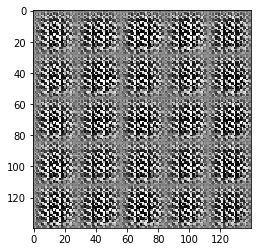


 Epoch 1/2 Step 200 Discriminator Loss: 5.3251 ...  Generator Loss: 0.0119

 Epoch 1/2 Step 210 Discriminator Loss: 5.1843 ...  Generator Loss: 0.0148

 Epoch 1/2 Step 220 Discriminator Loss: 4.4863 ...  Generator Loss: 0.0230

 Epoch 1/2 Step 230 Discriminator Loss: 4.4548 ...  Generator Loss: 0.0224

 Epoch 1/2 Step 240 Discriminator Loss: 4.9847 ...  Generator Loss: 0.0129

 Epoch 1/2 Step 250 Discriminator Loss: 4.5948 ...  Generator Loss: 0.0203

 Epoch 1/2 Step 260 Discriminator Loss: 4.7847 ...  Generator Loss: 0.0213

 Epoch 1/2 Step 270 Discriminator Loss: 4.3622 ...  Generator Loss: 0.0233

 Epoch 1/2 Step 280 Discriminator Loss: 4.7862 ...  Generator Loss: 0.0171

 Epoch 1/2 Step 290 Discriminator Loss: 4.5933 ...  Generator Loss: 0.0203


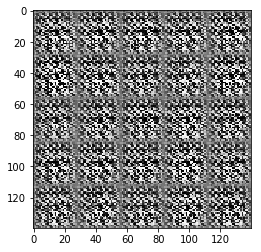


 Epoch 1/2 Step 300 Discriminator Loss: 4.8261 ...  Generator Loss: 0.0165

 Epoch 1/2 Step 310 Discriminator Loss: 4.4550 ...  Generator Loss: 0.0262

 Epoch 1/2 Step 320 Discriminator Loss: 4.1781 ...  Generator Loss: 0.0264

 Epoch 1/2 Step 330 Discriminator Loss: 4.1242 ...  Generator Loss: 0.0295

 Epoch 1/2 Step 340 Discriminator Loss: 4.6021 ...  Generator Loss: 0.0211

 Epoch 1/2 Step 350 Discriminator Loss: 3.9999 ...  Generator Loss: 0.0329

 Epoch 1/2 Step 360 Discriminator Loss: 4.0008 ...  Generator Loss: 0.0416

 Epoch 1/2 Step 370 Discriminator Loss: 4.0798 ...  Generator Loss: 0.0271

 Epoch 1/2 Step 380 Discriminator Loss: 4.1506 ...  Generator Loss: 0.0369

 Epoch 1/2 Step 390 Discriminator Loss: 3.8817 ...  Generator Loss: 0.0368


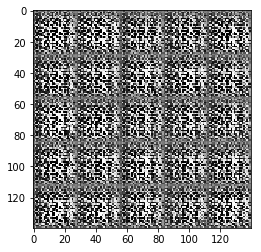


 Epoch 1/2 Step 400 Discriminator Loss: 4.0564 ...  Generator Loss: 0.0375

 Epoch 1/2 Step 410 Discriminator Loss: 3.9005 ...  Generator Loss: 0.0471

 Epoch 1/2 Step 420 Discriminator Loss: 4.0020 ...  Generator Loss: 0.0381

 Epoch 1/2 Step 430 Discriminator Loss: 3.9315 ...  Generator Loss: 0.0366

 Epoch 1/2 Step 440 Discriminator Loss: 3.9729 ...  Generator Loss: 0.0373

 Epoch 1/2 Step 450 Discriminator Loss: 3.9148 ...  Generator Loss: 0.0390

 Epoch 1/2 Step 460 Discriminator Loss: 3.5514 ...  Generator Loss: 0.0512

 Epoch 1/2 Step 470 Discriminator Loss: 3.8003 ...  Generator Loss: 0.0391

 Epoch 1/2 Step 480 Discriminator Loss: 3.6727 ...  Generator Loss: 0.0435

 Epoch 1/2 Step 490 Discriminator Loss: 3.7804 ...  Generator Loss: 0.0475


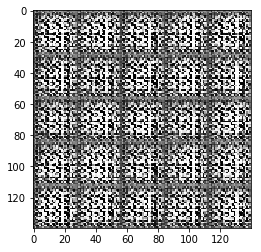


 Epoch 1/2 Step 500 Discriminator Loss: 3.6688 ...  Generator Loss: 0.0625

 Epoch 1/2 Step 510 Discriminator Loss: 3.5291 ...  Generator Loss: 0.0650

 Epoch 1/2 Step 520 Discriminator Loss: 3.5853 ...  Generator Loss: 0.0520

 Epoch 1/2 Step 530 Discriminator Loss: 3.2167 ...  Generator Loss: 0.0716

 Epoch 1/2 Step 540 Discriminator Loss: 3.4397 ...  Generator Loss: 0.0609

 Epoch 1/2 Step 550 Discriminator Loss: 3.3067 ...  Generator Loss: 0.0602

 Epoch 1/2 Step 560 Discriminator Loss: 3.2732 ...  Generator Loss: 0.0677

 Epoch 1/2 Step 570 Discriminator Loss: 3.0726 ...  Generator Loss: 0.0985

 Epoch 1/2 Step 580 Discriminator Loss: 2.8660 ...  Generator Loss: 0.0954

 Epoch 1/2 Step 590 Discriminator Loss: 3.1978 ...  Generator Loss: 0.0679


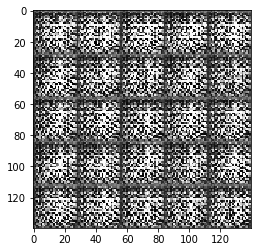


 Epoch 1/2 Step 600 Discriminator Loss: 2.7083 ...  Generator Loss: 0.1220

 Epoch 1/2 Step 610 Discriminator Loss: 2.9810 ...  Generator Loss: 0.0996

 Epoch 1/2 Step 620 Discriminator Loss: 2.6408 ...  Generator Loss: 0.1642

 Epoch 1/2 Step 630 Discriminator Loss: 2.5980 ...  Generator Loss: 0.1436

 Epoch 1/2 Step 640 Discriminator Loss: 2.4812 ...  Generator Loss: 0.1992

 Epoch 1/2 Step 650 Discriminator Loss: 2.3160 ...  Generator Loss: 0.1790

 Epoch 1/2 Step 660 Discriminator Loss: 2.4873 ...  Generator Loss: 0.1507

 Epoch 1/2 Step 670 Discriminator Loss: 2.4601 ...  Generator Loss: 0.2044

 Epoch 1/2 Step 680 Discriminator Loss: 2.4137 ...  Generator Loss: 0.1877

 Epoch 1/2 Step 690 Discriminator Loss: 1.9489 ...  Generator Loss: 0.3044


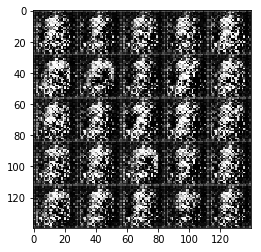


 Epoch 1/2 Step 700 Discriminator Loss: 2.4129 ...  Generator Loss: 0.2197

 Epoch 1/2 Step 710 Discriminator Loss: 2.3154 ...  Generator Loss: 0.2484

 Epoch 1/2 Step 720 Discriminator Loss: 2.2083 ...  Generator Loss: 0.2376

 Epoch 1/2 Step 730 Discriminator Loss: 2.0470 ...  Generator Loss: 0.2381

 Epoch 1/2 Step 740 Discriminator Loss: 2.4536 ...  Generator Loss: 0.1705

 Epoch 1/2 Step 750 Discriminator Loss: 2.5134 ...  Generator Loss: 0.1583

 Epoch 1/2 Step 760 Discriminator Loss: 2.5843 ...  Generator Loss: 0.1604

 Epoch 1/2 Step 770 Discriminator Loss: 1.9917 ...  Generator Loss: 0.3293

 Epoch 1/2 Step 780 Discriminator Loss: 2.5319 ...  Generator Loss: 0.1841

 Epoch 1/2 Step 790 Discriminator Loss: 1.8939 ...  Generator Loss: 0.3011


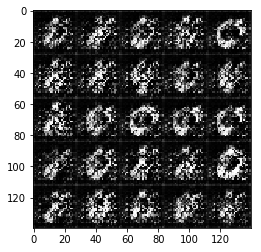


 Epoch 1/2 Step 800 Discriminator Loss: 1.8997 ...  Generator Loss: 0.2905

 Epoch 1/2 Step 810 Discriminator Loss: 1.9063 ...  Generator Loss: 0.3813

 Epoch 1/2 Step 820 Discriminator Loss: 2.0956 ...  Generator Loss: 0.3018

 Epoch 1/2 Step 830 Discriminator Loss: 2.2439 ...  Generator Loss: 0.2603

 Epoch 1/2 Step 840 Discriminator Loss: 1.9367 ...  Generator Loss: 0.3241

 Epoch 1/2 Step 850 Discriminator Loss: 2.1078 ...  Generator Loss: 0.3214

 Epoch 1/2 Step 860 Discriminator Loss: 1.9203 ...  Generator Loss: 0.2893

 Epoch 1/2 Step 870 Discriminator Loss: 2.1726 ...  Generator Loss: 0.2213

 Epoch 1/2 Step 880 Discriminator Loss: 2.0787 ...  Generator Loss: 0.3036

 Epoch 1/2 Step 890 Discriminator Loss: 1.7574 ...  Generator Loss: 0.4462


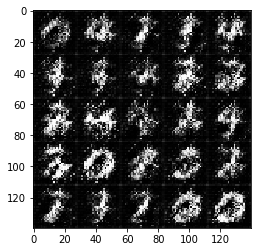


 Epoch 1/2 Step 900 Discriminator Loss: 1.7815 ...  Generator Loss: 0.4339

 Epoch 1/2 Step 910 Discriminator Loss: 1.7082 ...  Generator Loss: 0.4197

 Epoch 1/2 Step 920 Discriminator Loss: 2.0338 ...  Generator Loss: 0.3008

 Epoch 1/2 Step 930 Discriminator Loss: 1.8113 ...  Generator Loss: 0.3661

 Epoch 1/2 Step 940 Discriminator Loss: 1.7971 ...  Generator Loss: 0.3895

 Epoch 1/2 Step 950 Discriminator Loss: 1.8760 ...  Generator Loss: 0.3294

 Epoch 1/2 Step 960 Discriminator Loss: 1.8827 ...  Generator Loss: 0.3270

 Epoch 1/2 Step 970 Discriminator Loss: 1.6846 ...  Generator Loss: 0.4266

 Epoch 1/2 Step 980 Discriminator Loss: 1.9713 ...  Generator Loss: 0.3274

 Epoch 1/2 Step 990 Discriminator Loss: 2.2978 ...  Generator Loss: 0.2445


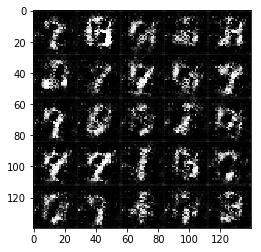


 Epoch 1/2 Step 1000 Discriminator Loss: 1.6712 ...  Generator Loss: 0.3936

 Epoch 1/2 Step 1010 Discriminator Loss: 1.9045 ...  Generator Loss: 0.2976

 Epoch 1/2 Step 1020 Discriminator Loss: 2.2461 ...  Generator Loss: 0.2611

 Epoch 1/2 Step 1030 Discriminator Loss: 1.6594 ...  Generator Loss: 0.4596

 Epoch 1/2 Step 1040 Discriminator Loss: 1.7936 ...  Generator Loss: 0.4230

 Epoch 1/2 Step 1050 Discriminator Loss: 1.9886 ...  Generator Loss: 0.3298

 Epoch 1/2 Step 1060 Discriminator Loss: 1.8861 ...  Generator Loss: 0.3723

 Epoch 1/2 Step 1070 Discriminator Loss: 1.6728 ...  Generator Loss: 0.4576

 Epoch 1/2 Step 1080 Discriminator Loss: 2.2757 ...  Generator Loss: 0.2304

 Epoch 1/2 Step 1090 Discriminator Loss: 1.7669 ...  Generator Loss: 0.4374


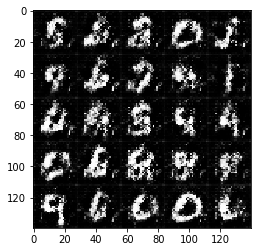


 Epoch 1/2 Step 1100 Discriminator Loss: 2.1930 ...  Generator Loss: 0.4053

 Epoch 1/2 Step 1110 Discriminator Loss: 1.9480 ...  Generator Loss: 0.3181

 Epoch 1/2 Step 1120 Discriminator Loss: 2.1502 ...  Generator Loss: 0.2803

 Epoch 1/2 Step 1130 Discriminator Loss: 1.9271 ...  Generator Loss: 0.4022

 Epoch 1/2 Step 1140 Discriminator Loss: 2.0213 ...  Generator Loss: 0.3416

 Epoch 1/2 Step 1150 Discriminator Loss: 2.1062 ...  Generator Loss: 0.3642

 Epoch 1/2 Step 1160 Discriminator Loss: 1.9277 ...  Generator Loss: 0.3173

 Epoch 1/2 Step 1170 Discriminator Loss: 2.2433 ...  Generator Loss: 0.2756

 Epoch 1/2 Step 1180 Discriminator Loss: 1.7984 ...  Generator Loss: 0.3512

 Epoch 1/2 Step 1190 Discriminator Loss: 1.8661 ...  Generator Loss: 0.3595


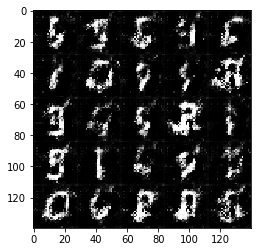


 Epoch 1/2 Step 1200 Discriminator Loss: 1.7285 ...  Generator Loss: 0.4132

 Epoch 1/2 Step 1210 Discriminator Loss: 1.8845 ...  Generator Loss: 0.3389

 Epoch 1/2 Step 1220 Discriminator Loss: 2.0059 ...  Generator Loss: 0.3294

 Epoch 1/2 Step 1230 Discriminator Loss: 1.9755 ...  Generator Loss: 0.3519

 Epoch 1/2 Step 1240 Discriminator Loss: 1.8146 ...  Generator Loss: 0.3751

 Epoch 1/2 Step 1250 Discriminator Loss: 1.7944 ...  Generator Loss: 0.3903

 Epoch 1/2 Step 1260 Discriminator Loss: 1.8300 ...  Generator Loss: 0.4296

 Epoch 1/2 Step 1270 Discriminator Loss: 2.0576 ...  Generator Loss: 0.3147

 Epoch 1/2 Step 1280 Discriminator Loss: 1.7229 ...  Generator Loss: 0.4748

 Epoch 1/2 Step 1290 Discriminator Loss: 1.7392 ...  Generator Loss: 0.4526


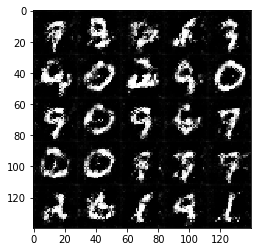


 Epoch 1/2 Step 1300 Discriminator Loss: 2.0981 ...  Generator Loss: 0.2586

 Epoch 1/2 Step 1310 Discriminator Loss: 1.7402 ...  Generator Loss: 0.4426

 Epoch 1/2 Step 1320 Discriminator Loss: 1.8366 ...  Generator Loss: 0.3951

 Epoch 1/2 Step 1330 Discriminator Loss: 1.9646 ...  Generator Loss: 0.4119

 Epoch 1/2 Step 1340 Discriminator Loss: 1.5996 ...  Generator Loss: 0.5145

 Epoch 1/2 Step 1350 Discriminator Loss: 1.8964 ...  Generator Loss: 0.4098

 Epoch 1/2 Step 1360 Discriminator Loss: 1.9289 ...  Generator Loss: 0.3345

 Epoch 1/2 Step 1370 Discriminator Loss: 1.8495 ...  Generator Loss: 0.3770

 Epoch 1/2 Step 1380 Discriminator Loss: 2.0183 ...  Generator Loss: 0.3796

 Epoch 1/2 Step 1390 Discriminator Loss: 1.8661 ...  Generator Loss: 0.3428


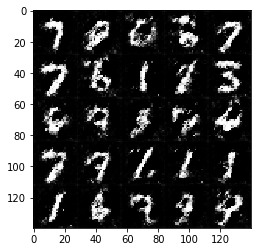


 Epoch 1/2 Step 1400 Discriminator Loss: 1.8646 ...  Generator Loss: 0.4143

 Epoch 1/2 Step 1410 Discriminator Loss: 1.7289 ...  Generator Loss: 0.4015

 Epoch 1/2 Step 1420 Discriminator Loss: 1.7356 ...  Generator Loss: 0.4210

 Epoch 1/2 Step 1430 Discriminator Loss: 1.7621 ...  Generator Loss: 0.3960

 Epoch 1/2 Step 1440 Discriminator Loss: 1.8968 ...  Generator Loss: 0.3406

 Epoch 1/2 Step 1450 Discriminator Loss: 1.8155 ...  Generator Loss: 0.4119

 Epoch 1/2 Step 1460 Discriminator Loss: 1.5638 ...  Generator Loss: 0.4849

 Epoch 1/2 Step 1470 Discriminator Loss: 1.9406 ...  Generator Loss: 0.3615

 Epoch 1/2 Step 1480 Discriminator Loss: 1.8470 ...  Generator Loss: 0.4018

 Epoch 1/2 Step 1490 Discriminator Loss: 1.7170 ...  Generator Loss: 0.4448


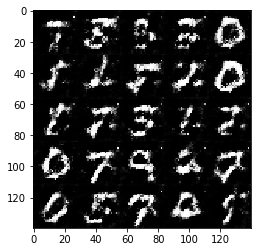


 Epoch 1/2 Step 1500 Discriminator Loss: 1.7488 ...  Generator Loss: 0.3950

 Epoch 1/2 Step 1510 Discriminator Loss: 1.7562 ...  Generator Loss: 0.3931

 Epoch 1/2 Step 1520 Discriminator Loss: 1.8287 ...  Generator Loss: 0.3899

 Epoch 1/2 Step 1530 Discriminator Loss: 1.7507 ...  Generator Loss: 0.4211

 Epoch 1/2 Step 1540 Discriminator Loss: 1.9763 ...  Generator Loss: 0.3230

 Epoch 1/2 Step 1550 Discriminator Loss: 1.8730 ...  Generator Loss: 0.3169

 Epoch 1/2 Step 1560 Discriminator Loss: 1.8208 ...  Generator Loss: 0.4089

 Epoch 1/2 Step 1570 Discriminator Loss: 1.8298 ...  Generator Loss: 0.4211

 Epoch 1/2 Step 1580 Discriminator Loss: 1.7204 ...  Generator Loss: 0.3713

 Epoch 1/2 Step 1590 Discriminator Loss: 1.7834 ...  Generator Loss: 0.3952


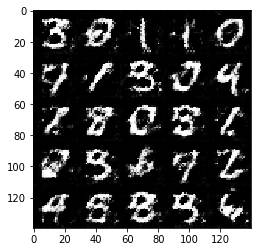


 Epoch 1/2 Step 1600 Discriminator Loss: 1.8299 ...  Generator Loss: 0.3693

 Epoch 1/2 Step 1610 Discriminator Loss: 1.7538 ...  Generator Loss: 0.4204

 Epoch 1/2 Step 1620 Discriminator Loss: 1.8414 ...  Generator Loss: 0.4916

 Epoch 1/2 Step 1630 Discriminator Loss: 1.7537 ...  Generator Loss: 0.4264

 Epoch 1/2 Step 1640 Discriminator Loss: 1.5883 ...  Generator Loss: 0.4092

 Epoch 1/2 Step 1650 Discriminator Loss: 2.0276 ...  Generator Loss: 0.3332

 Epoch 1/2 Step 1660 Discriminator Loss: 1.8601 ...  Generator Loss: 0.3756

 Epoch 1/2 Step 1670 Discriminator Loss: 1.5204 ...  Generator Loss: 0.5312

 Epoch 1/2 Step 1680 Discriminator Loss: 1.6589 ...  Generator Loss: 0.5196

 Epoch 1/2 Step 1690 Discriminator Loss: 1.7384 ...  Generator Loss: 0.4279


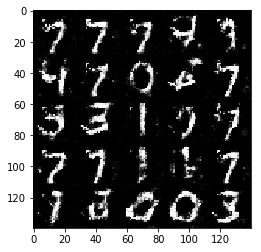


 Epoch 1/2 Step 1700 Discriminator Loss: 1.5676 ...  Generator Loss: 0.5226

 Epoch 1/2 Step 1710 Discriminator Loss: 2.0604 ...  Generator Loss: 0.3659

 Epoch 1/2 Step 1720 Discriminator Loss: 2.0669 ...  Generator Loss: 0.2973

 Epoch 1/2 Step 1730 Discriminator Loss: 1.8343 ...  Generator Loss: 0.3994

 Epoch 1/2 Step 1740 Discriminator Loss: 1.7311 ...  Generator Loss: 0.4925

 Epoch 1/2 Step 1750 Discriminator Loss: 1.6626 ...  Generator Loss: 0.3926

 Epoch 1/2 Step 1760 Discriminator Loss: 1.8148 ...  Generator Loss: 0.4554

 Epoch 1/2 Step 1770 Discriminator Loss: 1.5123 ...  Generator Loss: 0.5555

 Epoch 1/2 Step 1780 Discriminator Loss: 1.8782 ...  Generator Loss: 0.3838

 Epoch 1/2 Step 1790 Discriminator Loss: 1.8283 ...  Generator Loss: 0.4434


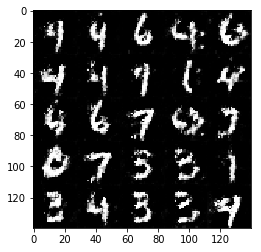


 Epoch 1/2 Step 1800 Discriminator Loss: 1.4870 ...  Generator Loss: 0.5438

 Epoch 1/2 Step 1810 Discriminator Loss: 1.8809 ...  Generator Loss: 0.4243

 Epoch 1/2 Step 1820 Discriminator Loss: 1.8527 ...  Generator Loss: 0.4056

 Epoch 1/2 Step 1830 Discriminator Loss: 1.8098 ...  Generator Loss: 0.4690

 Epoch 1/2 Step 1840 Discriminator Loss: 1.6713 ...  Generator Loss: 0.5025

 Epoch 1/2 Step 1850 Discriminator Loss: 1.7773 ...  Generator Loss: 0.4242

 Epoch 1/2 Step 1860 Discriminator Loss: 2.0522 ...  Generator Loss: 0.3166

 Epoch 1/2 Step 1870 Discriminator Loss: 1.6398 ...  Generator Loss: 0.4584

 Epoch 1/2... Discriminator Loss: 1.5390... Generator Loss: 0.5324

 Epoch 2/2 Step 1880 Discriminator Loss: 1.6704 ...  Generator Loss: 0.5050

 Epoch 2/2 Step 1890 Discriminator Loss: 1.7841 ...  Generator Loss: 0.4145


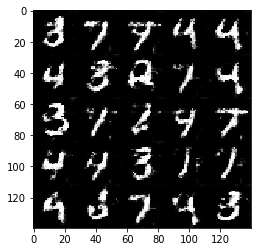


 Epoch 2/2 Step 1900 Discriminator Loss: 1.7694 ...  Generator Loss: 0.5316

 Epoch 2/2 Step 1910 Discriminator Loss: 1.7282 ...  Generator Loss: 0.4536

 Epoch 2/2 Step 1920 Discriminator Loss: 1.7400 ...  Generator Loss: 0.4379

 Epoch 2/2 Step 1930 Discriminator Loss: 1.8043 ...  Generator Loss: 0.4140

 Epoch 2/2 Step 1940 Discriminator Loss: 1.7323 ...  Generator Loss: 0.4544

 Epoch 2/2 Step 1950 Discriminator Loss: 1.7188 ...  Generator Loss: 0.4594

 Epoch 2/2 Step 1960 Discriminator Loss: 1.6051 ...  Generator Loss: 0.5381

 Epoch 2/2 Step 1970 Discriminator Loss: 1.8380 ...  Generator Loss: 0.4240

 Epoch 2/2 Step 1980 Discriminator Loss: 2.1436 ...  Generator Loss: 0.4728

 Epoch 2/2 Step 1990 Discriminator Loss: 1.4076 ...  Generator Loss: 0.5426


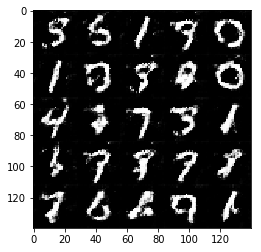


 Epoch 2/2 Step 2000 Discriminator Loss: 1.6220 ...  Generator Loss: 0.4868

 Epoch 2/2 Step 2010 Discriminator Loss: 1.6128 ...  Generator Loss: 0.4864

 Epoch 2/2 Step 2020 Discriminator Loss: 1.5833 ...  Generator Loss: 0.5478

 Epoch 2/2 Step 2030 Discriminator Loss: 1.8456 ...  Generator Loss: 0.4835

 Epoch 2/2 Step 2040 Discriminator Loss: 1.5475 ...  Generator Loss: 0.5396

 Epoch 2/2 Step 2050 Discriminator Loss: 1.5819 ...  Generator Loss: 0.5930

 Epoch 2/2 Step 2060 Discriminator Loss: 1.8326 ...  Generator Loss: 0.5241

 Epoch 2/2 Step 2070 Discriminator Loss: 1.6315 ...  Generator Loss: 0.5137

 Epoch 2/2 Step 2080 Discriminator Loss: 1.7093 ...  Generator Loss: 0.4836

 Epoch 2/2 Step 2090 Discriminator Loss: 1.7177 ...  Generator Loss: 0.5191


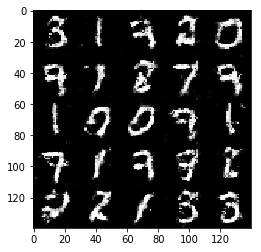


 Epoch 2/2 Step 2100 Discriminator Loss: 1.6839 ...  Generator Loss: 0.4957

 Epoch 2/2 Step 2110 Discriminator Loss: 1.7304 ...  Generator Loss: 0.5201

 Epoch 2/2 Step 2120 Discriminator Loss: 1.7040 ...  Generator Loss: 0.4622

 Epoch 2/2 Step 2130 Discriminator Loss: 1.5158 ...  Generator Loss: 0.5266

 Epoch 2/2 Step 2140 Discriminator Loss: 1.9267 ...  Generator Loss: 0.3963

 Epoch 2/2 Step 2150 Discriminator Loss: 1.5278 ...  Generator Loss: 0.5730

 Epoch 2/2 Step 2160 Discriminator Loss: 1.6565 ...  Generator Loss: 0.4619

 Epoch 2/2 Step 2170 Discriminator Loss: 1.6758 ...  Generator Loss: 0.4654

 Epoch 2/2 Step 2180 Discriminator Loss: 1.7224 ...  Generator Loss: 0.4245

 Epoch 2/2 Step 2190 Discriminator Loss: 2.2324 ...  Generator Loss: 0.3591


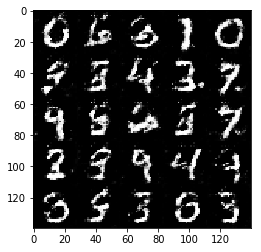


 Epoch 2/2 Step 2200 Discriminator Loss: 1.5328 ...  Generator Loss: 0.4985

 Epoch 2/2 Step 2210 Discriminator Loss: 1.5556 ...  Generator Loss: 0.4827

 Epoch 2/2 Step 2220 Discriminator Loss: 1.6614 ...  Generator Loss: 0.4771

 Epoch 2/2 Step 2230 Discriminator Loss: 1.5142 ...  Generator Loss: 0.5176

 Epoch 2/2 Step 2240 Discriminator Loss: 1.5457 ...  Generator Loss: 0.4925

 Epoch 2/2 Step 2250 Discriminator Loss: 1.4701 ...  Generator Loss: 0.6063

 Epoch 2/2 Step 2260 Discriminator Loss: 1.6140 ...  Generator Loss: 0.5126

 Epoch 2/2 Step 2270 Discriminator Loss: 1.6462 ...  Generator Loss: 0.5404

 Epoch 2/2 Step 2280 Discriminator Loss: 1.6452 ...  Generator Loss: 0.4205

 Epoch 2/2 Step 2290 Discriminator Loss: 1.7773 ...  Generator Loss: 0.4419


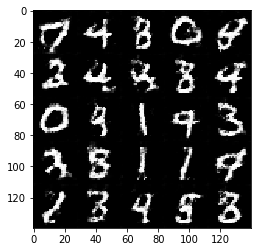


 Epoch 2/2 Step 2300 Discriminator Loss: 1.7605 ...  Generator Loss: 0.4624

 Epoch 2/2 Step 2310 Discriminator Loss: 1.5339 ...  Generator Loss: 0.5189

 Epoch 2/2 Step 2320 Discriminator Loss: 1.7335 ...  Generator Loss: 0.4537

 Epoch 2/2 Step 2330 Discriminator Loss: 1.8115 ...  Generator Loss: 0.4135

 Epoch 2/2 Step 2340 Discriminator Loss: 1.7721 ...  Generator Loss: 0.4763

 Epoch 2/2 Step 2350 Discriminator Loss: 1.5455 ...  Generator Loss: 0.5757

 Epoch 2/2 Step 2360 Discriminator Loss: 1.5372 ...  Generator Loss: 0.6135

 Epoch 2/2 Step 2370 Discriminator Loss: 1.4922 ...  Generator Loss: 0.5746

 Epoch 2/2 Step 2380 Discriminator Loss: 1.6939 ...  Generator Loss: 0.5033

 Epoch 2/2 Step 2390 Discriminator Loss: 1.7594 ...  Generator Loss: 0.5092


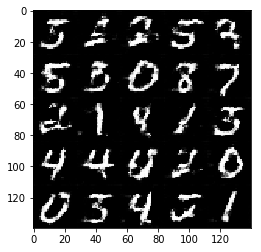


 Epoch 2/2 Step 2400 Discriminator Loss: 1.5796 ...  Generator Loss: 0.5790

 Epoch 2/2 Step 2410 Discriminator Loss: 1.6954 ...  Generator Loss: 0.4915

 Epoch 2/2 Step 2420 Discriminator Loss: 1.7418 ...  Generator Loss: 0.4469

 Epoch 2/2 Step 2430 Discriminator Loss: 1.4764 ...  Generator Loss: 0.6280

 Epoch 2/2 Step 2440 Discriminator Loss: 1.4237 ...  Generator Loss: 0.6471

 Epoch 2/2 Step 2450 Discriminator Loss: 1.5866 ...  Generator Loss: 0.5245

 Epoch 2/2 Step 2460 Discriminator Loss: 1.7872 ...  Generator Loss: 0.4204

 Epoch 2/2 Step 2470 Discriminator Loss: 1.3604 ...  Generator Loss: 0.6618

 Epoch 2/2 Step 2480 Discriminator Loss: 1.5978 ...  Generator Loss: 0.5712

 Epoch 2/2 Step 2490 Discriminator Loss: 1.5030 ...  Generator Loss: 0.4919


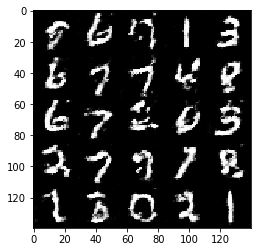


 Epoch 2/2 Step 2500 Discriminator Loss: 1.7861 ...  Generator Loss: 0.4238

 Epoch 2/2 Step 2510 Discriminator Loss: 1.4904 ...  Generator Loss: 0.5605

 Epoch 2/2 Step 2520 Discriminator Loss: 1.6192 ...  Generator Loss: 0.4526

 Epoch 2/2 Step 2530 Discriminator Loss: 1.8210 ...  Generator Loss: 0.4097

 Epoch 2/2 Step 2540 Discriminator Loss: 1.5586 ...  Generator Loss: 0.6617

 Epoch 2/2 Step 2550 Discriminator Loss: 1.6334 ...  Generator Loss: 0.5410

 Epoch 2/2 Step 2560 Discriminator Loss: 1.4911 ...  Generator Loss: 0.6361

 Epoch 2/2 Step 2570 Discriminator Loss: 1.7297 ...  Generator Loss: 0.3813

 Epoch 2/2 Step 2580 Discriminator Loss: 1.5937 ...  Generator Loss: 0.4415

 Epoch 2/2 Step 2590 Discriminator Loss: 1.8451 ...  Generator Loss: 0.4056


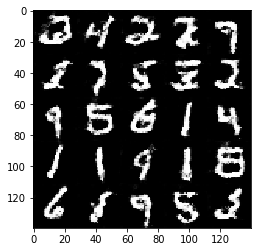


 Epoch 2/2 Step 2600 Discriminator Loss: 1.6241 ...  Generator Loss: 0.4772

 Epoch 2/2 Step 2610 Discriminator Loss: 1.6911 ...  Generator Loss: 0.5348

 Epoch 2/2 Step 2620 Discriminator Loss: 1.4950 ...  Generator Loss: 0.5375

 Epoch 2/2 Step 2630 Discriminator Loss: 1.3317 ...  Generator Loss: 0.5942

 Epoch 2/2 Step 2640 Discriminator Loss: 1.6128 ...  Generator Loss: 0.4231

 Epoch 2/2 Step 2650 Discriminator Loss: 1.5801 ...  Generator Loss: 0.5349

 Epoch 2/2 Step 2660 Discriminator Loss: 1.4926 ...  Generator Loss: 0.5991

 Epoch 2/2 Step 2670 Discriminator Loss: 1.6474 ...  Generator Loss: 0.4648

 Epoch 2/2 Step 2680 Discriminator Loss: 1.4954 ...  Generator Loss: 0.5326

 Epoch 2/2 Step 2690 Discriminator Loss: 1.6440 ...  Generator Loss: 0.4926


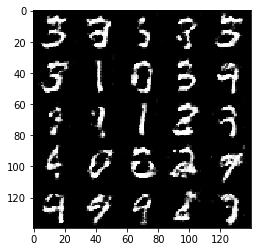


 Epoch 2/2 Step 2700 Discriminator Loss: 1.4513 ...  Generator Loss: 0.6099

 Epoch 2/2 Step 2710 Discriminator Loss: 1.8655 ...  Generator Loss: 0.4141

 Epoch 2/2 Step 2720 Discriminator Loss: 1.5831 ...  Generator Loss: 0.4864

 Epoch 2/2 Step 2730 Discriminator Loss: 1.3212 ...  Generator Loss: 0.6052

 Epoch 2/2 Step 2740 Discriminator Loss: 1.3713 ...  Generator Loss: 0.6164

 Epoch 2/2 Step 2750 Discriminator Loss: 1.6530 ...  Generator Loss: 0.5320

 Epoch 2/2 Step 2760 Discriminator Loss: 1.6444 ...  Generator Loss: 0.5134

 Epoch 2/2 Step 2770 Discriminator Loss: 2.0153 ...  Generator Loss: 0.4426

 Epoch 2/2 Step 2780 Discriminator Loss: 1.5140 ...  Generator Loss: 0.5749

 Epoch 2/2 Step 2790 Discriminator Loss: 1.6905 ...  Generator Loss: 0.4744


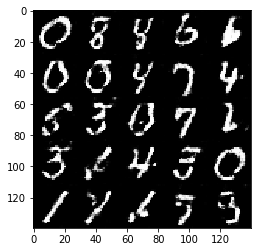


 Epoch 2/2 Step 2800 Discriminator Loss: 1.5702 ...  Generator Loss: 0.5125

 Epoch 2/2 Step 2810 Discriminator Loss: 1.6000 ...  Generator Loss: 0.5324

 Epoch 2/2 Step 2820 Discriminator Loss: 1.5844 ...  Generator Loss: 0.4920

 Epoch 2/2 Step 2830 Discriminator Loss: 1.7388 ...  Generator Loss: 0.5483

 Epoch 2/2 Step 2840 Discriminator Loss: 1.6476 ...  Generator Loss: 0.6251

 Epoch 2/2 Step 2850 Discriminator Loss: 1.7819 ...  Generator Loss: 0.5367

 Epoch 2/2 Step 2860 Discriminator Loss: 1.6151 ...  Generator Loss: 0.4947

 Epoch 2/2 Step 2870 Discriminator Loss: 1.8248 ...  Generator Loss: 0.4039

 Epoch 2/2 Step 2880 Discriminator Loss: 1.8309 ...  Generator Loss: 0.4080

 Epoch 2/2 Step 2890 Discriminator Loss: 1.5417 ...  Generator Loss: 0.5322


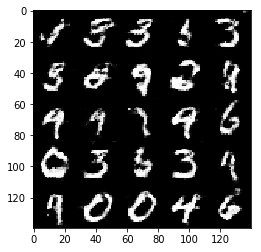


 Epoch 2/2 Step 2900 Discriminator Loss: 1.4092 ...  Generator Loss: 0.6759

 Epoch 2/2 Step 2910 Discriminator Loss: 1.6701 ...  Generator Loss: 0.4481

 Epoch 2/2 Step 2920 Discriminator Loss: 1.6483 ...  Generator Loss: 0.5052

 Epoch 2/2 Step 2930 Discriminator Loss: 1.6061 ...  Generator Loss: 0.5130

 Epoch 2/2 Step 2940 Discriminator Loss: 1.6719 ...  Generator Loss: 0.4876

 Epoch 2/2 Step 2950 Discriminator Loss: 1.8308 ...  Generator Loss: 0.4559

 Epoch 2/2 Step 2960 Discriminator Loss: 1.6971 ...  Generator Loss: 0.5793

 Epoch 2/2 Step 2970 Discriminator Loss: 1.7674 ...  Generator Loss: 0.4661

 Epoch 2/2 Step 2980 Discriminator Loss: 1.6301 ...  Generator Loss: 0.5534

 Epoch 2/2 Step 2990 Discriminator Loss: 1.6040 ...  Generator Loss: 0.5183


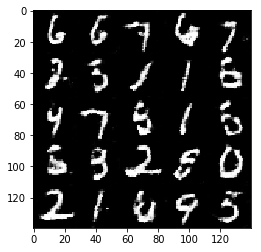


 Epoch 2/2 Step 3000 Discriminator Loss: 1.6368 ...  Generator Loss: 0.6148

 Epoch 2/2 Step 3010 Discriminator Loss: 1.7448 ...  Generator Loss: 0.4656

 Epoch 2/2 Step 3020 Discriminator Loss: 1.4450 ...  Generator Loss: 0.6158

 Epoch 2/2 Step 3030 Discriminator Loss: 1.5465 ...  Generator Loss: 0.5562

 Epoch 2/2 Step 3040 Discriminator Loss: 1.5471 ...  Generator Loss: 0.5407

 Epoch 2/2 Step 3050 Discriminator Loss: 1.6800 ...  Generator Loss: 0.4589

 Epoch 2/2 Step 3060 Discriminator Loss: 1.6964 ...  Generator Loss: 0.6245

 Epoch 2/2 Step 3070 Discriminator Loss: 1.6405 ...  Generator Loss: 0.4565

 Epoch 2/2 Step 3080 Discriminator Loss: 1.6984 ...  Generator Loss: 0.5291

 Epoch 2/2 Step 3090 Discriminator Loss: 1.8797 ...  Generator Loss: 0.4843


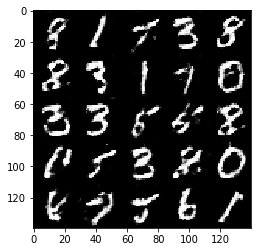


 Epoch 2/2 Step 3100 Discriminator Loss: 1.6499 ...  Generator Loss: 0.4469

 Epoch 2/2 Step 3110 Discriminator Loss: 1.7932 ...  Generator Loss: 0.4698

 Epoch 2/2 Step 3120 Discriminator Loss: 1.8002 ...  Generator Loss: 0.5436

 Epoch 2/2 Step 3130 Discriminator Loss: 1.5977 ...  Generator Loss: 0.6032

 Epoch 2/2 Step 3140 Discriminator Loss: 1.9765 ...  Generator Loss: 0.4868

 Epoch 2/2 Step 3150 Discriminator Loss: 1.5311 ...  Generator Loss: 0.6305

 Epoch 2/2 Step 3160 Discriminator Loss: 1.7359 ...  Generator Loss: 0.4787

 Epoch 2/2 Step 3170 Discriminator Loss: 1.5651 ...  Generator Loss: 0.6794

 Epoch 2/2 Step 3180 Discriminator Loss: 1.5126 ...  Generator Loss: 0.6040

 Epoch 2/2 Step 3190 Discriminator Loss: 1.6137 ...  Generator Loss: 0.5320


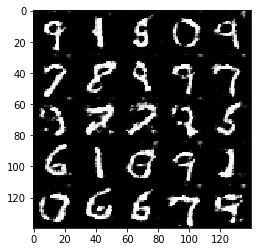


 Epoch 2/2 Step 3200 Discriminator Loss: 1.3968 ...  Generator Loss: 0.6227

 Epoch 2/2 Step 3210 Discriminator Loss: 1.5850 ...  Generator Loss: 0.4580

 Epoch 2/2 Step 3220 Discriminator Loss: 1.3947 ...  Generator Loss: 0.5866

 Epoch 2/2 Step 3230 Discriminator Loss: 1.8938 ...  Generator Loss: 0.5108

 Epoch 2/2 Step 3240 Discriminator Loss: 1.5266 ...  Generator Loss: 0.6410

 Epoch 2/2 Step 3250 Discriminator Loss: 1.2703 ...  Generator Loss: 0.6729

 Epoch 2/2 Step 3260 Discriminator Loss: 1.6876 ...  Generator Loss: 0.4113

 Epoch 2/2 Step 3270 Discriminator Loss: 1.8029 ...  Generator Loss: 0.4461

 Epoch 2/2 Step 3280 Discriminator Loss: 1.4185 ...  Generator Loss: 0.5660

 Epoch 2/2 Step 3290 Discriminator Loss: 1.8578 ...  Generator Loss: 0.3971


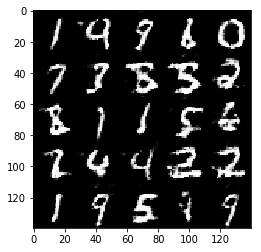


 Epoch 2/2 Step 3300 Discriminator Loss: 1.3543 ...  Generator Loss: 0.7274

 Epoch 2/2 Step 3310 Discriminator Loss: 1.3090 ...  Generator Loss: 0.6802

 Epoch 2/2 Step 3320 Discriminator Loss: 1.5139 ...  Generator Loss: 0.4748

 Epoch 2/2 Step 3330 Discriminator Loss: 1.6159 ...  Generator Loss: 0.5740

 Epoch 2/2 Step 3340 Discriminator Loss: 1.4396 ...  Generator Loss: 0.7482

 Epoch 2/2 Step 3350 Discriminator Loss: 1.5449 ...  Generator Loss: 0.4657

 Epoch 2/2 Step 3360 Discriminator Loss: 1.6592 ...  Generator Loss: 0.4596

 Epoch 2/2 Step 3370 Discriminator Loss: 1.8521 ...  Generator Loss: 0.4637

 Epoch 2/2 Step 3380 Discriminator Loss: 1.6880 ...  Generator Loss: 0.4925

 Epoch 2/2 Step 3390 Discriminator Loss: 1.6621 ...  Generator Loss: 0.4053


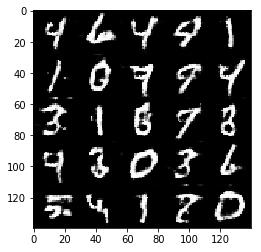


 Epoch 2/2 Step 3400 Discriminator Loss: 1.6838 ...  Generator Loss: 0.4553

 Epoch 2/2 Step 3410 Discriminator Loss: 1.7197 ...  Generator Loss: 0.5427

 Epoch 2/2 Step 3420 Discriminator Loss: 1.5797 ...  Generator Loss: 0.5794

 Epoch 2/2 Step 3430 Discriminator Loss: 1.4527 ...  Generator Loss: 0.5829

 Epoch 2/2 Step 3440 Discriminator Loss: 1.6887 ...  Generator Loss: 0.4286

 Epoch 2/2 Step 3450 Discriminator Loss: 1.4826 ...  Generator Loss: 0.6791

 Epoch 2/2 Step 3460 Discriminator Loss: 1.7223 ...  Generator Loss: 0.4778

 Epoch 2/2 Step 3470 Discriminator Loss: 1.6688 ...  Generator Loss: 0.4747

 Epoch 2/2 Step 3480 Discriminator Loss: 1.7379 ...  Generator Loss: 0.4845

 Epoch 2/2 Step 3490 Discriminator Loss: 1.5022 ...  Generator Loss: 0.5380


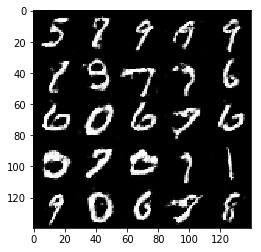


 Epoch 2/2 Step 3500 Discriminator Loss: 1.5300 ...  Generator Loss: 0.5674

 Epoch 2/2 Step 3510 Discriminator Loss: 1.6166 ...  Generator Loss: 0.4434

 Epoch 2/2 Step 3520 Discriminator Loss: 1.5440 ...  Generator Loss: 0.5200

 Epoch 2/2 Step 3530 Discriminator Loss: 1.5262 ...  Generator Loss: 0.5462

 Epoch 2/2 Step 3540 Discriminator Loss: 1.6044 ...  Generator Loss: 0.5660

 Epoch 2/2 Step 3550 Discriminator Loss: 1.4572 ...  Generator Loss: 0.6793

 Epoch 2/2 Step 3560 Discriminator Loss: 1.6344 ...  Generator Loss: 0.5314

 Epoch 2/2 Step 3570 Discriminator Loss: 1.3889 ...  Generator Loss: 0.6127

 Epoch 2/2 Step 3580 Discriminator Loss: 1.6151 ...  Generator Loss: 0.5298

 Epoch 2/2 Step 3590 Discriminator Loss: 1.6567 ...  Generator Loss: 0.5380


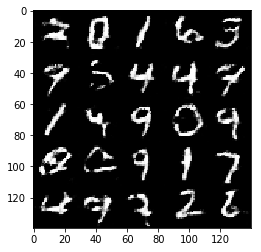


 Epoch 2/2 Step 3600 Discriminator Loss: 1.5433 ...  Generator Loss: 0.5493

 Epoch 2/2 Step 3610 Discriminator Loss: 1.7175 ...  Generator Loss: 0.4317

 Epoch 2/2 Step 3620 Discriminator Loss: 1.3294 ...  Generator Loss: 0.6796

 Epoch 2/2 Step 3630 Discriminator Loss: 1.7313 ...  Generator Loss: 0.4097

 Epoch 2/2 Step 3640 Discriminator Loss: 1.3259 ...  Generator Loss: 0.6852

 Epoch 2/2 Step 3650 Discriminator Loss: 1.5131 ...  Generator Loss: 0.5128

 Epoch 2/2 Step 3660 Discriminator Loss: 1.2075 ...  Generator Loss: 0.7175

 Epoch 2/2 Step 3670 Discriminator Loss: 1.3727 ...  Generator Loss: 0.7045

 Epoch 2/2 Step 3680 Discriminator Loss: 1.5780 ...  Generator Loss: 0.4655

 Epoch 2/2 Step 3690 Discriminator Loss: 1.3189 ...  Generator Loss: 0.6817


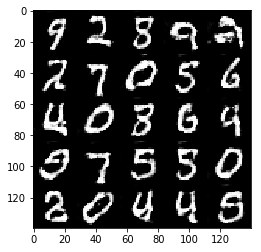


 Epoch 2/2 Step 3700 Discriminator Loss: 1.7941 ...  Generator Loss: 0.5604

 Epoch 2/2 Step 3710 Discriminator Loss: 1.7677 ...  Generator Loss: 0.4496

 Epoch 2/2 Step 3720 Discriminator Loss: 1.5357 ...  Generator Loss: 0.5721

 Epoch 2/2 Step 3730 Discriminator Loss: 1.4491 ...  Generator Loss: 0.6666

 Epoch 2/2 Step 3740 Discriminator Loss: 1.7945 ...  Generator Loss: 0.3874

 Epoch 2/2 Step 3750 Discriminator Loss: 1.3150 ...  Generator Loss: 0.7137

 Epoch 2/2... Discriminator Loss: 1.3150... Generator Loss: 0.7137


In [57]:
batch_size = 32
z_dim = 100
learning_rate = .0002
beta1 = .3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.


 Epoch 1/1 Step 10 Discriminator Loss: 12.1280 ...  Generator Loss: 0.0000

 Epoch 1/1 Step 20 Discriminator Loss: 11.9133 ...  Generator Loss: 0.0000

 Epoch 1/1 Step 30 Discriminator Loss: 13.9106 ...  Generator Loss: 0.0000

 Epoch 1/1 Step 40 Discriminator Loss: 12.4876 ...  Generator Loss: 0.0002

 Epoch 1/1 Step 50 Discriminator Loss: 11.5125 ...  Generator Loss: 0.0030

 Epoch 1/1 Step 60 Discriminator Loss: 10.8675 ...  Generator Loss: 0.0041

 Epoch 1/1 Step 70 Discriminator Loss: 10.4743 ...  Generator Loss: 0.0001

 Epoch 1/1 Step 80 Discriminator Loss: 10.4977 ...  Generator Loss: 0.0001

 Epoch 1/1 Step 90 Discriminator Loss: 9.3517 ...  Generator Loss: 0.0006


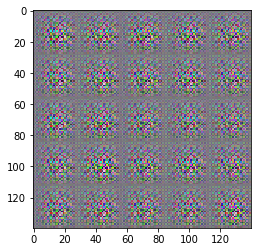


 Epoch 1/1 Step 100 Discriminator Loss: 7.7605 ...  Generator Loss: 0.0023

 Epoch 1/1 Step 110 Discriminator Loss: 9.2287 ...  Generator Loss: 0.0003

 Epoch 1/1 Step 120 Discriminator Loss: 6.7419 ...  Generator Loss: 0.0071

 Epoch 1/1 Step 130 Discriminator Loss: 7.0862 ...  Generator Loss: 0.0044

 Epoch 1/1 Step 140 Discriminator Loss: 6.4253 ...  Generator Loss: 0.0032

 Epoch 1/1 Step 150 Discriminator Loss: 6.7303 ...  Generator Loss: 0.0028

 Epoch 1/1 Step 160 Discriminator Loss: 5.7160 ...  Generator Loss: 0.0111

 Epoch 1/1 Step 170 Discriminator Loss: 5.1647 ...  Generator Loss: 0.0102

 Epoch 1/1 Step 180 Discriminator Loss: 4.6856 ...  Generator Loss: 0.0252

 Epoch 1/1 Step 190 Discriminator Loss: 4.7505 ...  Generator Loss: 0.0151


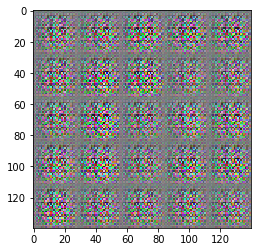


 Epoch 1/1 Step 200 Discriminator Loss: 5.1675 ...  Generator Loss: 0.0157

 Epoch 1/1 Step 210 Discriminator Loss: 4.2698 ...  Generator Loss: 0.0314

 Epoch 1/1 Step 220 Discriminator Loss: 5.5053 ...  Generator Loss: 0.0095

 Epoch 1/1 Step 230 Discriminator Loss: 4.3932 ...  Generator Loss: 0.0302

 Epoch 1/1 Step 240 Discriminator Loss: 4.6482 ...  Generator Loss: 0.0219

 Epoch 1/1 Step 250 Discriminator Loss: 4.1865 ...  Generator Loss: 0.0354

 Epoch 1/1 Step 260 Discriminator Loss: 3.1330 ...  Generator Loss: 0.0729

 Epoch 1/1 Step 270 Discriminator Loss: 3.9792 ...  Generator Loss: 0.0449

 Epoch 1/1 Step 280 Discriminator Loss: 3.9504 ...  Generator Loss: 0.0347

 Epoch 1/1 Step 290 Discriminator Loss: 3.1186 ...  Generator Loss: 0.0790


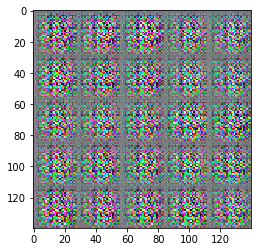


 Epoch 1/1 Step 300 Discriminator Loss: 3.9101 ...  Generator Loss: 0.0478

 Epoch 1/1 Step 310 Discriminator Loss: 3.4127 ...  Generator Loss: 0.0687

 Epoch 1/1 Step 320 Discriminator Loss: 4.0844 ...  Generator Loss: 0.0308

 Epoch 1/1 Step 330 Discriminator Loss: 3.1731 ...  Generator Loss: 0.0958

 Epoch 1/1 Step 340 Discriminator Loss: 3.9532 ...  Generator Loss: 0.0437

 Epoch 1/1 Step 350 Discriminator Loss: 4.2529 ...  Generator Loss: 0.0581

 Epoch 1/1 Step 360 Discriminator Loss: 3.7397 ...  Generator Loss: 0.0476

 Epoch 1/1 Step 370 Discriminator Loss: 3.5458 ...  Generator Loss: 0.0618

 Epoch 1/1 Step 380 Discriminator Loss: 4.1098 ...  Generator Loss: 0.0374

 Epoch 1/1 Step 390 Discriminator Loss: 3.4698 ...  Generator Loss: 0.0819


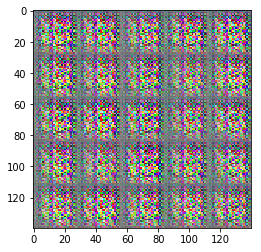


 Epoch 1/1 Step 400 Discriminator Loss: 3.8165 ...  Generator Loss: 0.0380

 Epoch 1/1 Step 410 Discriminator Loss: 3.7677 ...  Generator Loss: 0.0518

 Epoch 1/1 Step 420 Discriminator Loss: 3.0710 ...  Generator Loss: 0.1033

 Epoch 1/1 Step 430 Discriminator Loss: 3.6425 ...  Generator Loss: 0.0606

 Epoch 1/1 Step 440 Discriminator Loss: 3.4807 ...  Generator Loss: 0.0657

 Epoch 1/1 Step 450 Discriminator Loss: 3.4211 ...  Generator Loss: 0.0590

 Epoch 1/1 Step 460 Discriminator Loss: 3.8486 ...  Generator Loss: 0.0539

 Epoch 1/1 Step 470 Discriminator Loss: 3.0919 ...  Generator Loss: 0.0849

 Epoch 1/1 Step 480 Discriminator Loss: 3.1479 ...  Generator Loss: 0.0785

 Epoch 1/1 Step 490 Discriminator Loss: 3.5197 ...  Generator Loss: 0.0774


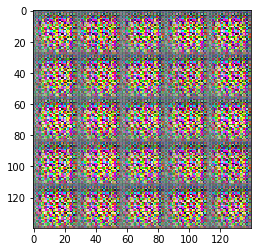


 Epoch 1/1 Step 500 Discriminator Loss: 3.4348 ...  Generator Loss: 0.0599

 Epoch 1/1 Step 510 Discriminator Loss: 3.5682 ...  Generator Loss: 0.0479

 Epoch 1/1 Step 520 Discriminator Loss: 3.3485 ...  Generator Loss: 0.0804

 Epoch 1/1 Step 530 Discriminator Loss: 3.2290 ...  Generator Loss: 0.0672

 Epoch 1/1 Step 540 Discriminator Loss: 3.1976 ...  Generator Loss: 0.0806

 Epoch 1/1 Step 550 Discriminator Loss: 2.6520 ...  Generator Loss: 0.1343

 Epoch 1/1 Step 560 Discriminator Loss: 3.1211 ...  Generator Loss: 0.0904

 Epoch 1/1 Step 570 Discriminator Loss: 2.6699 ...  Generator Loss: 0.1364

 Epoch 1/1 Step 580 Discriminator Loss: 3.3207 ...  Generator Loss: 0.0958

 Epoch 1/1 Step 590 Discriminator Loss: 3.2087 ...  Generator Loss: 0.0763


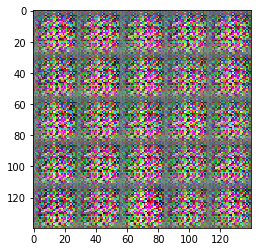


 Epoch 1/1 Step 600 Discriminator Loss: 3.1472 ...  Generator Loss: 0.0832

 Epoch 1/1 Step 610 Discriminator Loss: 2.4240 ...  Generator Loss: 0.1745

 Epoch 1/1 Step 620 Discriminator Loss: 2.7291 ...  Generator Loss: 0.1423

 Epoch 1/1 Step 630 Discriminator Loss: 2.5288 ...  Generator Loss: 0.1808

 Epoch 1/1 Step 640 Discriminator Loss: 2.5430 ...  Generator Loss: 0.1746

 Epoch 1/1 Step 650 Discriminator Loss: 3.5508 ...  Generator Loss: 0.0642

 Epoch 1/1 Step 660 Discriminator Loss: 2.6426 ...  Generator Loss: 0.1485

 Epoch 1/1 Step 670 Discriminator Loss: 3.1396 ...  Generator Loss: 0.0744

 Epoch 1/1 Step 680 Discriminator Loss: 2.6868 ...  Generator Loss: 0.1350

 Epoch 1/1 Step 690 Discriminator Loss: 2.7672 ...  Generator Loss: 0.1224


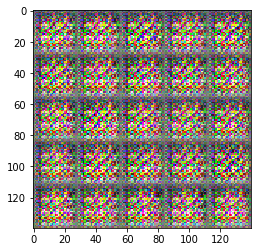


 Epoch 1/1 Step 700 Discriminator Loss: 2.8406 ...  Generator Loss: 0.1279

 Epoch 1/1 Step 710 Discriminator Loss: 3.4133 ...  Generator Loss: 0.0714

 Epoch 1/1 Step 720 Discriminator Loss: 1.9459 ...  Generator Loss: 0.2763

 Epoch 1/1 Step 730 Discriminator Loss: 1.5847 ...  Generator Loss: 0.5485

 Epoch 1/1 Step 740 Discriminator Loss: 1.3959 ...  Generator Loss: 0.6486

 Epoch 1/1 Step 750 Discriminator Loss: 1.7607 ...  Generator Loss: 0.5342

 Epoch 1/1 Step 760 Discriminator Loss: 2.0629 ...  Generator Loss: 0.2996

 Epoch 1/1 Step 770 Discriminator Loss: 2.2605 ...  Generator Loss: 0.4806

 Epoch 1/1 Step 780 Discriminator Loss: 1.8510 ...  Generator Loss: 0.4064

 Epoch 1/1 Step 790 Discriminator Loss: 1.9604 ...  Generator Loss: 0.3894


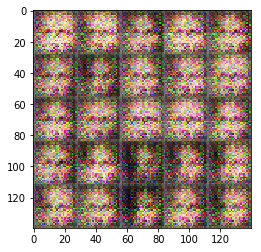


 Epoch 1/1 Step 800 Discriminator Loss: 2.2068 ...  Generator Loss: 0.3250

 Epoch 1/1 Step 810 Discriminator Loss: 2.0992 ...  Generator Loss: 0.2840

 Epoch 1/1 Step 820 Discriminator Loss: 2.1379 ...  Generator Loss: 0.3571

 Epoch 1/1 Step 830 Discriminator Loss: 2.1713 ...  Generator Loss: 0.4156

 Epoch 1/1 Step 840 Discriminator Loss: 1.8670 ...  Generator Loss: 0.3711

 Epoch 1/1 Step 850 Discriminator Loss: 2.0222 ...  Generator Loss: 0.4850

 Epoch 1/1 Step 860 Discriminator Loss: 1.7579 ...  Generator Loss: 0.4330

 Epoch 1/1 Step 870 Discriminator Loss: 2.1291 ...  Generator Loss: 0.3326

 Epoch 1/1 Step 880 Discriminator Loss: 1.7162 ...  Generator Loss: 0.4553

 Epoch 1/1 Step 890 Discriminator Loss: 1.9368 ...  Generator Loss: 0.4362


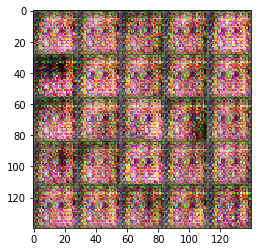


 Epoch 1/1 Step 900 Discriminator Loss: 1.8172 ...  Generator Loss: 0.3581

 Epoch 1/1 Step 910 Discriminator Loss: 2.0554 ...  Generator Loss: 0.3097

 Epoch 1/1 Step 920 Discriminator Loss: 3.0167 ...  Generator Loss: 0.1540

 Epoch 1/1 Step 930 Discriminator Loss: 2.4068 ...  Generator Loss: 0.2147

 Epoch 1/1 Step 940 Discriminator Loss: 2.1315 ...  Generator Loss: 0.2348

 Epoch 1/1 Step 950 Discriminator Loss: 1.9866 ...  Generator Loss: 0.4273

 Epoch 1/1 Step 960 Discriminator Loss: 2.1274 ...  Generator Loss: 0.3510

 Epoch 1/1 Step 970 Discriminator Loss: 1.7838 ...  Generator Loss: 0.6910

 Epoch 1/1 Step 980 Discriminator Loss: 1.6172 ...  Generator Loss: 0.6310

 Epoch 1/1 Step 990 Discriminator Loss: 1.7835 ...  Generator Loss: 0.5124


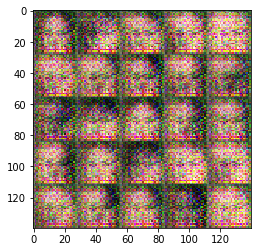


 Epoch 1/1 Step 1000 Discriminator Loss: 1.5738 ...  Generator Loss: 0.5253

 Epoch 1/1 Step 1010 Discriminator Loss: 1.4444 ...  Generator Loss: 0.6538

 Epoch 1/1 Step 1020 Discriminator Loss: 1.6723 ...  Generator Loss: 0.4642

 Epoch 1/1 Step 1030 Discriminator Loss: 2.0708 ...  Generator Loss: 0.4592

 Epoch 1/1 Step 1040 Discriminator Loss: 1.6433 ...  Generator Loss: 0.5034

 Epoch 1/1 Step 1050 Discriminator Loss: 1.7449 ...  Generator Loss: 0.4598

 Epoch 1/1 Step 1060 Discriminator Loss: 1.8434 ...  Generator Loss: 0.4391

 Epoch 1/1 Step 1070 Discriminator Loss: 2.0230 ...  Generator Loss: 0.3109

 Epoch 1/1 Step 1080 Discriminator Loss: 2.1551 ...  Generator Loss: 0.2826

 Epoch 1/1 Step 1090 Discriminator Loss: 2.1963 ...  Generator Loss: 0.3132


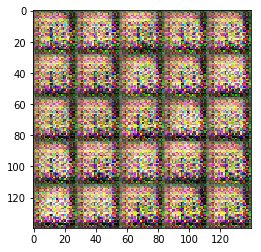


 Epoch 1/1 Step 1100 Discriminator Loss: 2.2533 ...  Generator Loss: 0.1993

 Epoch 1/1 Step 1110 Discriminator Loss: 3.4162 ...  Generator Loss: 0.0603

 Epoch 1/1 Step 1120 Discriminator Loss: 2.9202 ...  Generator Loss: 0.1328

 Epoch 1/1 Step 1130 Discriminator Loss: 4.1974 ...  Generator Loss: 0.0319

 Epoch 1/1 Step 1140 Discriminator Loss: 1.5592 ...  Generator Loss: 0.6972

 Epoch 1/1 Step 1150 Discriminator Loss: 2.4382 ...  Generator Loss: 0.1925

 Epoch 1/1 Step 1160 Discriminator Loss: 2.6193 ...  Generator Loss: 0.1511

 Epoch 1/1 Step 1170 Discriminator Loss: 2.0718 ...  Generator Loss: 0.2416

 Epoch 1/1 Step 1180 Discriminator Loss: 2.0998 ...  Generator Loss: 0.2665

 Epoch 1/1 Step 1190 Discriminator Loss: 1.8180 ...  Generator Loss: 0.3883


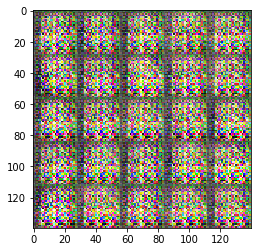


 Epoch 1/1 Step 1200 Discriminator Loss: 2.3163 ...  Generator Loss: 0.2716

 Epoch 1/1 Step 1210 Discriminator Loss: 1.7140 ...  Generator Loss: 0.4491

 Epoch 1/1 Step 1220 Discriminator Loss: 2.0342 ...  Generator Loss: 0.3249

 Epoch 1/1 Step 1230 Discriminator Loss: 1.7033 ...  Generator Loss: 0.4583

 Epoch 1/1 Step 1240 Discriminator Loss: 1.7046 ...  Generator Loss: 0.3863

 Epoch 1/1 Step 1250 Discriminator Loss: 1.4366 ...  Generator Loss: 0.6415

 Epoch 1/1 Step 1260 Discriminator Loss: 1.5760 ...  Generator Loss: 0.6106

 Epoch 1/1 Step 1270 Discriminator Loss: 1.5004 ...  Generator Loss: 0.6209

 Epoch 1/1 Step 1280 Discriminator Loss: 1.6130 ...  Generator Loss: 0.6422

 Epoch 1/1 Step 1290 Discriminator Loss: 1.8585 ...  Generator Loss: 0.5477


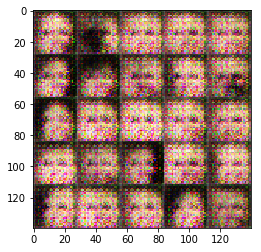


 Epoch 1/1 Step 1300 Discriminator Loss: 1.6651 ...  Generator Loss: 0.6331

 Epoch 1/1 Step 1310 Discriminator Loss: 1.8281 ...  Generator Loss: 0.4373

 Epoch 1/1 Step 1320 Discriminator Loss: 1.8589 ...  Generator Loss: 0.4067

 Epoch 1/1 Step 1330 Discriminator Loss: 1.5506 ...  Generator Loss: 0.5097

 Epoch 1/1 Step 1340 Discriminator Loss: 1.7014 ...  Generator Loss: 0.5003

 Epoch 1/1 Step 1350 Discriminator Loss: 1.9491 ...  Generator Loss: 0.4803

 Epoch 1/1 Step 1360 Discriminator Loss: 2.0544 ...  Generator Loss: 0.4185

 Epoch 1/1 Step 1370 Discriminator Loss: 1.6699 ...  Generator Loss: 0.4760

 Epoch 1/1 Step 1380 Discriminator Loss: 1.8687 ...  Generator Loss: 0.4037

 Epoch 1/1 Step 1390 Discriminator Loss: 2.1038 ...  Generator Loss: 0.3940


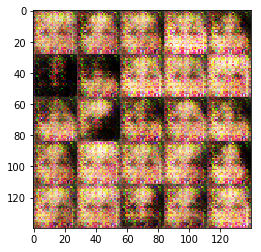


 Epoch 1/1 Step 1400 Discriminator Loss: 1.3427 ...  Generator Loss: 0.7875

 Epoch 1/1 Step 1410 Discriminator Loss: 1.8233 ...  Generator Loss: 0.5833

 Epoch 1/1 Step 1420 Discriminator Loss: 1.9149 ...  Generator Loss: 0.4210

 Epoch 1/1 Step 1430 Discriminator Loss: 1.8170 ...  Generator Loss: 0.3997

 Epoch 1/1 Step 1440 Discriminator Loss: 1.5821 ...  Generator Loss: 0.5076

 Epoch 1/1 Step 1450 Discriminator Loss: 1.4783 ...  Generator Loss: 0.6872

 Epoch 1/1 Step 1460 Discriminator Loss: 1.4718 ...  Generator Loss: 0.6508

 Epoch 1/1 Step 1470 Discriminator Loss: 1.6271 ...  Generator Loss: 0.4971

 Epoch 1/1 Step 1480 Discriminator Loss: 1.7532 ...  Generator Loss: 0.4118

 Epoch 1/1 Step 1490 Discriminator Loss: 1.8005 ...  Generator Loss: 0.5747


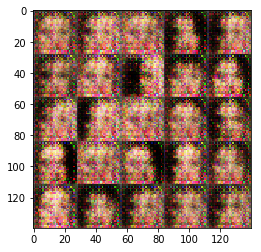


 Epoch 1/1 Step 1500 Discriminator Loss: 1.4841 ...  Generator Loss: 0.8326

 Epoch 1/1 Step 1510 Discriminator Loss: 1.5418 ...  Generator Loss: 0.6065

 Epoch 1/1 Step 1520 Discriminator Loss: 1.5276 ...  Generator Loss: 0.5104

 Epoch 1/1 Step 1530 Discriminator Loss: 1.4854 ...  Generator Loss: 0.5585

 Epoch 1/1 Step 1540 Discriminator Loss: 1.6824 ...  Generator Loss: 0.5374

 Epoch 1/1 Step 1550 Discriminator Loss: 1.7972 ...  Generator Loss: 0.5130

 Epoch 1/1 Step 1560 Discriminator Loss: 1.6275 ...  Generator Loss: 0.6507

 Epoch 1/1 Step 1570 Discriminator Loss: 2.0570 ...  Generator Loss: 0.3310

 Epoch 1/1 Step 1580 Discriminator Loss: 1.6773 ...  Generator Loss: 0.5167

 Epoch 1/1 Step 1590 Discriminator Loss: 1.4781 ...  Generator Loss: 0.6156


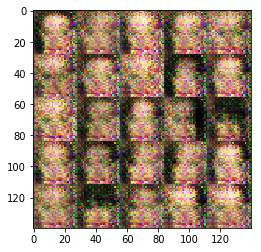


 Epoch 1/1 Step 1600 Discriminator Loss: 1.5730 ...  Generator Loss: 0.5821

 Epoch 1/1 Step 1610 Discriminator Loss: 1.7997 ...  Generator Loss: 0.4112

 Epoch 1/1 Step 1620 Discriminator Loss: 1.5279 ...  Generator Loss: 0.5871

 Epoch 1/1 Step 1630 Discriminator Loss: 1.6704 ...  Generator Loss: 0.4709

 Epoch 1/1 Step 1640 Discriminator Loss: 1.8375 ...  Generator Loss: 0.5318

 Epoch 1/1 Step 1650 Discriminator Loss: 1.8471 ...  Generator Loss: 0.4720

 Epoch 1/1 Step 1660 Discriminator Loss: 1.5015 ...  Generator Loss: 0.7103

 Epoch 1/1 Step 1670 Discriminator Loss: 1.6274 ...  Generator Loss: 0.6721

 Epoch 1/1 Step 1680 Discriminator Loss: 1.3052 ...  Generator Loss: 0.7116

 Epoch 1/1 Step 1690 Discriminator Loss: 1.9350 ...  Generator Loss: 0.4400


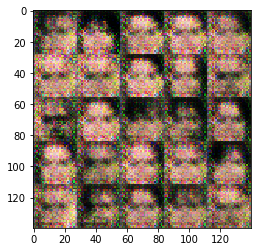


 Epoch 1/1 Step 1700 Discriminator Loss: 1.5834 ...  Generator Loss: 0.5762

 Epoch 1/1 Step 1710 Discriminator Loss: 1.6795 ...  Generator Loss: 0.4746

 Epoch 1/1 Step 1720 Discriminator Loss: 1.7349 ...  Generator Loss: 0.5932

 Epoch 1/1 Step 1730 Discriminator Loss: 1.5057 ...  Generator Loss: 0.6238

 Epoch 1/1 Step 1740 Discriminator Loss: 1.6938 ...  Generator Loss: 0.5894

 Epoch 1/1 Step 1750 Discriminator Loss: 1.5956 ...  Generator Loss: 0.5767

 Epoch 1/1 Step 1760 Discriminator Loss: 1.6114 ...  Generator Loss: 0.6454

 Epoch 1/1 Step 1770 Discriminator Loss: 1.3466 ...  Generator Loss: 0.7363

 Epoch 1/1 Step 1780 Discriminator Loss: 1.7589 ...  Generator Loss: 0.5582

 Epoch 1/1 Step 1790 Discriminator Loss: 1.6140 ...  Generator Loss: 0.5958


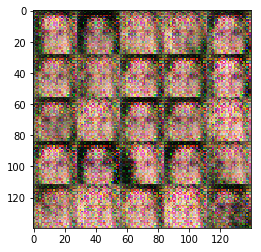


 Epoch 1/1 Step 1800 Discriminator Loss: 1.8703 ...  Generator Loss: 0.5196

 Epoch 1/1 Step 1810 Discriminator Loss: 1.6811 ...  Generator Loss: 0.5448

 Epoch 1/1 Step 1820 Discriminator Loss: 1.4991 ...  Generator Loss: 0.5793

 Epoch 1/1 Step 1830 Discriminator Loss: 1.6126 ...  Generator Loss: 0.4928

 Epoch 1/1 Step 1840 Discriminator Loss: 1.8048 ...  Generator Loss: 0.4694

 Epoch 1/1 Step 1850 Discriminator Loss: 1.8240 ...  Generator Loss: 0.4526

 Epoch 1/1 Step 1860 Discriminator Loss: 1.8328 ...  Generator Loss: 0.4091

 Epoch 1/1 Step 1870 Discriminator Loss: 1.5460 ...  Generator Loss: 0.6046

 Epoch 1/1 Step 1880 Discriminator Loss: 1.7409 ...  Generator Loss: 0.5430

 Epoch 1/1 Step 1890 Discriminator Loss: 1.5533 ...  Generator Loss: 0.6290


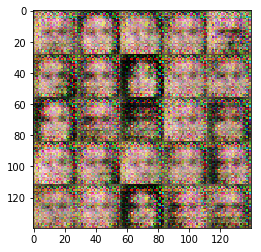


 Epoch 1/1 Step 1900 Discriminator Loss: 1.5310 ...  Generator Loss: 0.5613

 Epoch 1/1 Step 1910 Discriminator Loss: 1.5002 ...  Generator Loss: 0.6881

 Epoch 1/1 Step 1920 Discriminator Loss: 1.6481 ...  Generator Loss: 0.5271

 Epoch 1/1 Step 1930 Discriminator Loss: 1.7351 ...  Generator Loss: 0.5479

 Epoch 1/1 Step 1940 Discriminator Loss: 1.6673 ...  Generator Loss: 0.6421

 Epoch 1/1 Step 1950 Discriminator Loss: 1.8356 ...  Generator Loss: 0.6055

 Epoch 1/1 Step 1960 Discriminator Loss: 1.5879 ...  Generator Loss: 0.5601

 Epoch 1/1 Step 1970 Discriminator Loss: 1.5142 ...  Generator Loss: 0.6904

 Epoch 1/1 Step 1980 Discriminator Loss: 1.4692 ...  Generator Loss: 0.6101

 Epoch 1/1 Step 1990 Discriminator Loss: 1.6758 ...  Generator Loss: 0.5978


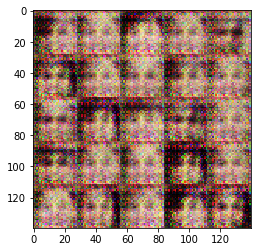


 Epoch 1/1 Step 2000 Discriminator Loss: 1.6291 ...  Generator Loss: 0.6916

 Epoch 1/1 Step 2010 Discriminator Loss: 1.4633 ...  Generator Loss: 0.7210

 Epoch 1/1 Step 2020 Discriminator Loss: 1.6541 ...  Generator Loss: 0.4817

 Epoch 1/1 Step 2030 Discriminator Loss: 1.5589 ...  Generator Loss: 0.6263

 Epoch 1/1 Step 2040 Discriminator Loss: 1.6656 ...  Generator Loss: 0.6121

 Epoch 1/1 Step 2050 Discriminator Loss: 1.4508 ...  Generator Loss: 0.6897

 Epoch 1/1 Step 2060 Discriminator Loss: 1.4750 ...  Generator Loss: 0.6603

 Epoch 1/1 Step 2070 Discriminator Loss: 1.9289 ...  Generator Loss: 0.4119

 Epoch 1/1 Step 2080 Discriminator Loss: 1.6860 ...  Generator Loss: 0.5496

 Epoch 1/1 Step 2090 Discriminator Loss: 1.7059 ...  Generator Loss: 0.5878


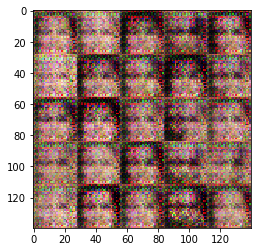


 Epoch 1/1 Step 2100 Discriminator Loss: 1.6989 ...  Generator Loss: 0.5961

 Epoch 1/1 Step 2110 Discriminator Loss: 1.7194 ...  Generator Loss: 0.4750

 Epoch 1/1 Step 2120 Discriminator Loss: 1.5926 ...  Generator Loss: 0.6296

 Epoch 1/1 Step 2130 Discriminator Loss: 1.7648 ...  Generator Loss: 0.5460

 Epoch 1/1 Step 2140 Discriminator Loss: 1.7354 ...  Generator Loss: 0.5988

 Epoch 1/1 Step 2150 Discriminator Loss: 1.6986 ...  Generator Loss: 0.4820

 Epoch 1/1 Step 2160 Discriminator Loss: 1.7567 ...  Generator Loss: 0.5543

 Epoch 1/1 Step 2170 Discriminator Loss: 1.6827 ...  Generator Loss: 0.6831

 Epoch 1/1 Step 2180 Discriminator Loss: 1.8171 ...  Generator Loss: 0.6825

 Epoch 1/1 Step 2190 Discriminator Loss: 1.5323 ...  Generator Loss: 0.7799


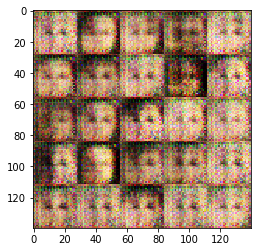


 Epoch 1/1 Step 2200 Discriminator Loss: 1.5065 ...  Generator Loss: 0.6365

 Epoch 1/1 Step 2210 Discriminator Loss: 1.5808 ...  Generator Loss: 0.6344

 Epoch 1/1 Step 2220 Discriminator Loss: 1.7792 ...  Generator Loss: 0.5596

 Epoch 1/1 Step 2230 Discriminator Loss: 1.6648 ...  Generator Loss: 0.5311

 Epoch 1/1 Step 2240 Discriminator Loss: 1.4458 ...  Generator Loss: 0.6767

 Epoch 1/1 Step 2250 Discriminator Loss: 1.6036 ...  Generator Loss: 0.8157

 Epoch 1/1 Step 2260 Discriminator Loss: 1.6885 ...  Generator Loss: 0.7119

 Epoch 1/1 Step 2270 Discriminator Loss: 1.6034 ...  Generator Loss: 0.6675

 Epoch 1/1 Step 2280 Discriminator Loss: 1.7974 ...  Generator Loss: 0.5181

 Epoch 1/1 Step 2290 Discriminator Loss: 1.7760 ...  Generator Loss: 0.5851


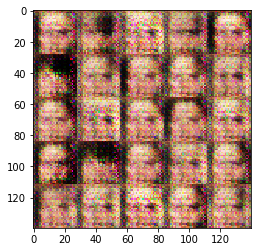


 Epoch 1/1 Step 2300 Discriminator Loss: 1.3362 ...  Generator Loss: 0.7015

 Epoch 1/1 Step 2310 Discriminator Loss: 1.7476 ...  Generator Loss: 0.5527

 Epoch 1/1 Step 2320 Discriminator Loss: 1.8047 ...  Generator Loss: 0.5023

 Epoch 1/1 Step 2330 Discriminator Loss: 1.3946 ...  Generator Loss: 0.6460

 Epoch 1/1 Step 2340 Discriminator Loss: 1.6130 ...  Generator Loss: 0.5905

 Epoch 1/1 Step 2350 Discriminator Loss: 1.5928 ...  Generator Loss: 0.6506

 Epoch 1/1 Step 2360 Discriminator Loss: 1.7087 ...  Generator Loss: 0.5519

 Epoch 1/1 Step 2370 Discriminator Loss: 1.6604 ...  Generator Loss: 0.5336

 Epoch 1/1 Step 2380 Discriminator Loss: 1.5615 ...  Generator Loss: 0.6812

 Epoch 1/1 Step 2390 Discriminator Loss: 1.5276 ...  Generator Loss: 0.6184


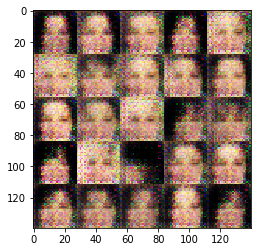


 Epoch 1/1 Step 2400 Discriminator Loss: 1.4307 ...  Generator Loss: 0.6688

 Epoch 1/1 Step 2410 Discriminator Loss: 1.5988 ...  Generator Loss: 0.6471

 Epoch 1/1 Step 2420 Discriminator Loss: 1.4657 ...  Generator Loss: 0.6748

 Epoch 1/1 Step 2430 Discriminator Loss: 1.6914 ...  Generator Loss: 0.5439

 Epoch 1/1 Step 2440 Discriminator Loss: 1.4417 ...  Generator Loss: 0.6660

 Epoch 1/1 Step 2450 Discriminator Loss: 1.4328 ...  Generator Loss: 0.6271

 Epoch 1/1 Step 2460 Discriminator Loss: 1.8072 ...  Generator Loss: 0.4997

 Epoch 1/1 Step 2470 Discriminator Loss: 1.7666 ...  Generator Loss: 0.4399

 Epoch 1/1 Step 2480 Discriminator Loss: 1.3358 ...  Generator Loss: 0.7379

 Epoch 1/1 Step 2490 Discriminator Loss: 1.5955 ...  Generator Loss: 0.6022


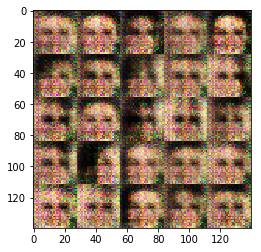


 Epoch 1/1 Step 2500 Discriminator Loss: 1.5573 ...  Generator Loss: 0.5652

 Epoch 1/1 Step 2510 Discriminator Loss: 1.8054 ...  Generator Loss: 0.4777

 Epoch 1/1 Step 2520 Discriminator Loss: 1.6006 ...  Generator Loss: 0.6639

 Epoch 1/1 Step 2530 Discriminator Loss: 1.6280 ...  Generator Loss: 0.5520

 Epoch 1/1 Step 2540 Discriminator Loss: 1.3832 ...  Generator Loss: 0.6804

 Epoch 1/1 Step 2550 Discriminator Loss: 1.5965 ...  Generator Loss: 0.6718

 Epoch 1/1 Step 2560 Discriminator Loss: 1.5827 ...  Generator Loss: 0.6354

 Epoch 1/1 Step 2570 Discriminator Loss: 1.3733 ...  Generator Loss: 0.7634

 Epoch 1/1 Step 2580 Discriminator Loss: 1.6213 ...  Generator Loss: 0.5897

 Epoch 1/1 Step 2590 Discriminator Loss: 1.4925 ...  Generator Loss: 0.6817


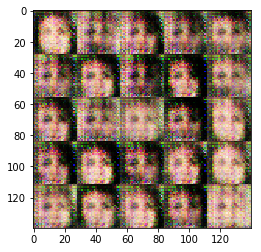


 Epoch 1/1 Step 2600 Discriminator Loss: 1.5532 ...  Generator Loss: 0.6305

 Epoch 1/1 Step 2610 Discriminator Loss: 1.8430 ...  Generator Loss: 0.6076

 Epoch 1/1 Step 2620 Discriminator Loss: 1.7406 ...  Generator Loss: 0.4652

 Epoch 1/1 Step 2630 Discriminator Loss: 1.4402 ...  Generator Loss: 0.6740

 Epoch 1/1 Step 2640 Discriminator Loss: 1.6835 ...  Generator Loss: 0.6218

 Epoch 1/1 Step 2650 Discriminator Loss: 1.4799 ...  Generator Loss: 0.7015

 Epoch 1/1 Step 2660 Discriminator Loss: 1.6745 ...  Generator Loss: 0.5131

 Epoch 1/1 Step 2670 Discriminator Loss: 1.6012 ...  Generator Loss: 0.6148

 Epoch 1/1 Step 2680 Discriminator Loss: 1.4361 ...  Generator Loss: 0.5552

 Epoch 1/1 Step 2690 Discriminator Loss: 1.7906 ...  Generator Loss: 0.6070


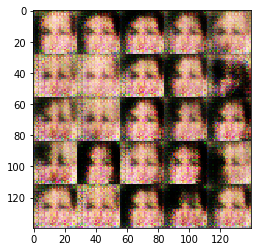


 Epoch 1/1 Step 2700 Discriminator Loss: 1.6250 ...  Generator Loss: 0.5615

 Epoch 1/1 Step 2710 Discriminator Loss: 1.7086 ...  Generator Loss: 0.6437

 Epoch 1/1 Step 2720 Discriminator Loss: 1.5751 ...  Generator Loss: 0.7581

 Epoch 1/1 Step 2730 Discriminator Loss: 1.3948 ...  Generator Loss: 0.6223

 Epoch 1/1 Step 2740 Discriminator Loss: 1.5344 ...  Generator Loss: 0.6169

 Epoch 1/1 Step 2750 Discriminator Loss: 1.6273 ...  Generator Loss: 0.5482

 Epoch 1/1 Step 2760 Discriminator Loss: 1.3616 ...  Generator Loss: 0.7620

 Epoch 1/1 Step 2770 Discriminator Loss: 1.4344 ...  Generator Loss: 0.6023

 Epoch 1/1 Step 2780 Discriminator Loss: 1.4322 ...  Generator Loss: 0.6387

 Epoch 1/1 Step 2790 Discriminator Loss: 1.7076 ...  Generator Loss: 0.5864


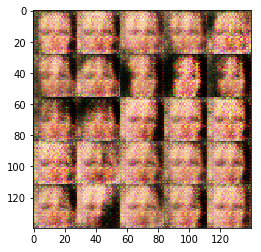


 Epoch 1/1 Step 2800 Discriminator Loss: 1.6460 ...  Generator Loss: 0.5635

 Epoch 1/1 Step 2810 Discriminator Loss: 1.5349 ...  Generator Loss: 0.6017

 Epoch 1/1 Step 2820 Discriminator Loss: 1.6634 ...  Generator Loss: 0.5687

 Epoch 1/1 Step 2830 Discriminator Loss: 1.9328 ...  Generator Loss: 0.5235

 Epoch 1/1 Step 2840 Discriminator Loss: 1.4469 ...  Generator Loss: 0.7417

 Epoch 1/1 Step 2850 Discriminator Loss: 1.6009 ...  Generator Loss: 0.5944

 Epoch 1/1 Step 2860 Discriminator Loss: 1.6454 ...  Generator Loss: 0.5817

 Epoch 1/1 Step 2870 Discriminator Loss: 1.4231 ...  Generator Loss: 0.8293

 Epoch 1/1 Step 2880 Discriminator Loss: 1.6125 ...  Generator Loss: 0.5368

 Epoch 1/1 Step 2890 Discriminator Loss: 1.5038 ...  Generator Loss: 0.6452


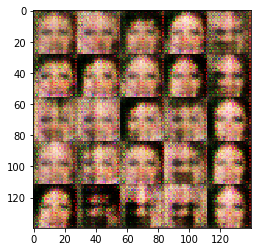


 Epoch 1/1 Step 2900 Discriminator Loss: 1.5771 ...  Generator Loss: 0.6213

 Epoch 1/1 Step 2910 Discriminator Loss: 1.5822 ...  Generator Loss: 0.7524

 Epoch 1/1 Step 2920 Discriminator Loss: 1.5829 ...  Generator Loss: 0.6659

 Epoch 1/1 Step 2930 Discriminator Loss: 1.4817 ...  Generator Loss: 0.6386

 Epoch 1/1 Step 2940 Discriminator Loss: 1.7636 ...  Generator Loss: 0.5688

 Epoch 1/1 Step 2950 Discriminator Loss: 1.6348 ...  Generator Loss: 0.5663

 Epoch 1/1 Step 2960 Discriminator Loss: 1.5981 ...  Generator Loss: 0.6626

 Epoch 1/1 Step 2970 Discriminator Loss: 1.6417 ...  Generator Loss: 0.7919

 Epoch 1/1 Step 2980 Discriminator Loss: 1.5010 ...  Generator Loss: 0.6462

 Epoch 1/1 Step 2990 Discriminator Loss: 1.5382 ...  Generator Loss: 0.5865


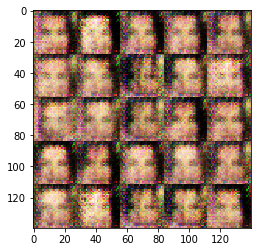


 Epoch 1/1 Step 3000 Discriminator Loss: 1.5600 ...  Generator Loss: 0.5148

 Epoch 1/1 Step 3010 Discriminator Loss: 1.4812 ...  Generator Loss: 0.6291

 Epoch 1/1 Step 3020 Discriminator Loss: 1.6454 ...  Generator Loss: 0.5827

 Epoch 1/1 Step 3030 Discriminator Loss: 1.7422 ...  Generator Loss: 0.5190

 Epoch 1/1 Step 3040 Discriminator Loss: 1.5939 ...  Generator Loss: 0.6746

 Epoch 1/1 Step 3050 Discriminator Loss: 1.5238 ...  Generator Loss: 0.6507

 Epoch 1/1 Step 3060 Discriminator Loss: 1.5512 ...  Generator Loss: 0.7426

 Epoch 1/1 Step 3070 Discriminator Loss: 1.6262 ...  Generator Loss: 0.5448

 Epoch 1/1 Step 3080 Discriminator Loss: 1.4646 ...  Generator Loss: 0.6800

 Epoch 1/1 Step 3090 Discriminator Loss: 1.5512 ...  Generator Loss: 0.6599


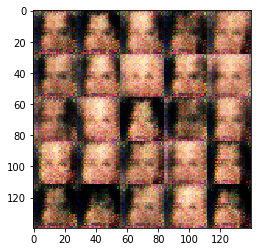


 Epoch 1/1 Step 3100 Discriminator Loss: 1.5565 ...  Generator Loss: 0.6960

 Epoch 1/1 Step 3110 Discriminator Loss: 1.5473 ...  Generator Loss: 0.6687

 Epoch 1/1 Step 3120 Discriminator Loss: 1.5445 ...  Generator Loss: 0.6474

 Epoch 1/1 Step 3130 Discriminator Loss: 1.3422 ...  Generator Loss: 0.7894

 Epoch 1/1 Step 3140 Discriminator Loss: 1.5883 ...  Generator Loss: 0.6050

 Epoch 1/1 Step 3150 Discriminator Loss: 1.5499 ...  Generator Loss: 0.6104

 Epoch 1/1 Step 3160 Discriminator Loss: 1.6735 ...  Generator Loss: 0.5273

 Epoch 1/1 Step 3170 Discriminator Loss: 1.7612 ...  Generator Loss: 0.5029

 Epoch 1/1 Step 3180 Discriminator Loss: 1.5707 ...  Generator Loss: 0.5431

 Epoch 1/1 Step 3190 Discriminator Loss: 1.4792 ...  Generator Loss: 0.6169


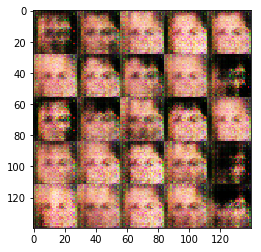


 Epoch 1/1 Step 3200 Discriminator Loss: 1.4063 ...  Generator Loss: 0.6715

 Epoch 1/1 Step 3210 Discriminator Loss: 1.3857 ...  Generator Loss: 0.7338

 Epoch 1/1 Step 3220 Discriminator Loss: 1.4819 ...  Generator Loss: 0.6535

 Epoch 1/1 Step 3230 Discriminator Loss: 1.1770 ...  Generator Loss: 0.7983

 Epoch 1/1 Step 3240 Discriminator Loss: 1.4103 ...  Generator Loss: 0.7516

 Epoch 1/1 Step 3250 Discriminator Loss: 1.5947 ...  Generator Loss: 0.6210

 Epoch 1/1 Step 3260 Discriminator Loss: 1.6742 ...  Generator Loss: 0.5666

 Epoch 1/1 Step 3270 Discriminator Loss: 1.4718 ...  Generator Loss: 0.5992

 Epoch 1/1 Step 3280 Discriminator Loss: 1.3877 ...  Generator Loss: 0.6229

 Epoch 1/1 Step 3290 Discriminator Loss: 1.9921 ...  Generator Loss: 0.5588


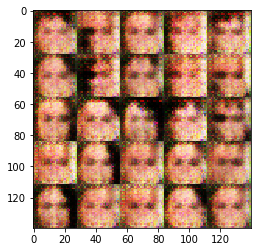


 Epoch 1/1 Step 3300 Discriminator Loss: 1.5746 ...  Generator Loss: 0.6029

 Epoch 1/1 Step 3310 Discriminator Loss: 1.6235 ...  Generator Loss: 0.5754

 Epoch 1/1 Step 3320 Discriminator Loss: 1.6164 ...  Generator Loss: 0.4799

 Epoch 1/1 Step 3330 Discriminator Loss: 1.3890 ...  Generator Loss: 0.7352

 Epoch 1/1 Step 3340 Discriminator Loss: 1.6228 ...  Generator Loss: 0.5588

 Epoch 1/1 Step 3350 Discriminator Loss: 1.7910 ...  Generator Loss: 0.6544

 Epoch 1/1 Step 3360 Discriminator Loss: 1.5323 ...  Generator Loss: 0.5733

 Epoch 1/1 Step 3370 Discriminator Loss: 1.4134 ...  Generator Loss: 0.6878

 Epoch 1/1 Step 3380 Discriminator Loss: 1.5587 ...  Generator Loss: 0.5964

 Epoch 1/1 Step 3390 Discriminator Loss: 1.8138 ...  Generator Loss: 0.5069


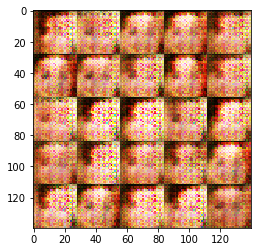


 Epoch 1/1 Step 3400 Discriminator Loss: 1.6229 ...  Generator Loss: 0.5618

 Epoch 1/1 Step 3410 Discriminator Loss: 1.6723 ...  Generator Loss: 0.5351

 Epoch 1/1 Step 3420 Discriminator Loss: 1.6951 ...  Generator Loss: 0.5216

 Epoch 1/1 Step 3430 Discriminator Loss: 1.8703 ...  Generator Loss: 0.5312

 Epoch 1/1 Step 3440 Discriminator Loss: 1.4639 ...  Generator Loss: 0.6373

 Epoch 1/1 Step 3450 Discriminator Loss: 1.4589 ...  Generator Loss: 0.6976

 Epoch 1/1 Step 3460 Discriminator Loss: 1.4256 ...  Generator Loss: 0.7413

 Epoch 1/1 Step 3470 Discriminator Loss: 1.6484 ...  Generator Loss: 0.5888

 Epoch 1/1 Step 3480 Discriminator Loss: 1.5101 ...  Generator Loss: 0.5932

 Epoch 1/1 Step 3490 Discriminator Loss: 1.6463 ...  Generator Loss: 0.5849


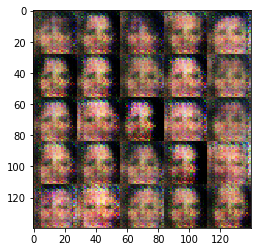


 Epoch 1/1 Step 3500 Discriminator Loss: 1.5388 ...  Generator Loss: 0.6760

 Epoch 1/1 Step 3510 Discriminator Loss: 1.7081 ...  Generator Loss: 0.7565

 Epoch 1/1 Step 3520 Discriminator Loss: 1.2305 ...  Generator Loss: 0.8248

 Epoch 1/1 Step 3530 Discriminator Loss: 1.3578 ...  Generator Loss: 0.7370

 Epoch 1/1 Step 3540 Discriminator Loss: 1.5909 ...  Generator Loss: 0.6695

 Epoch 1/1 Step 3550 Discriminator Loss: 1.6318 ...  Generator Loss: 0.6626

 Epoch 1/1 Step 3560 Discriminator Loss: 1.6591 ...  Generator Loss: 0.6409

 Epoch 1/1 Step 3570 Discriminator Loss: 1.5613 ...  Generator Loss: 0.5526

 Epoch 1/1 Step 3580 Discriminator Loss: 1.4033 ...  Generator Loss: 0.6725

 Epoch 1/1 Step 3590 Discriminator Loss: 1.4529 ...  Generator Loss: 0.7125


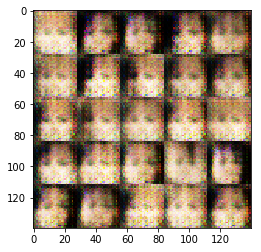


 Epoch 1/1 Step 3600 Discriminator Loss: 1.4890 ...  Generator Loss: 0.6600

 Epoch 1/1 Step 3610 Discriminator Loss: 1.5393 ...  Generator Loss: 0.6348

 Epoch 1/1 Step 3620 Discriminator Loss: 1.5170 ...  Generator Loss: 0.6152

 Epoch 1/1 Step 3630 Discriminator Loss: 1.7505 ...  Generator Loss: 0.4606

 Epoch 1/1 Step 3640 Discriminator Loss: 1.6721 ...  Generator Loss: 0.6110

 Epoch 1/1 Step 3650 Discriminator Loss: 1.3521 ...  Generator Loss: 0.7628

 Epoch 1/1 Step 3660 Discriminator Loss: 1.4179 ...  Generator Loss: 0.7259

 Epoch 1/1 Step 3670 Discriminator Loss: 1.5641 ...  Generator Loss: 0.6114

 Epoch 1/1 Step 3680 Discriminator Loss: 1.7248 ...  Generator Loss: 0.5429

 Epoch 1/1 Step 3690 Discriminator Loss: 1.7723 ...  Generator Loss: 0.5547


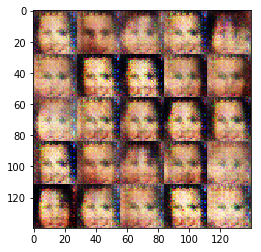


 Epoch 1/1 Step 3700 Discriminator Loss: 1.7762 ...  Generator Loss: 0.4638

 Epoch 1/1 Step 3710 Discriminator Loss: 1.5561 ...  Generator Loss: 0.6480

 Epoch 1/1 Step 3720 Discriminator Loss: 1.6682 ...  Generator Loss: 0.5353

 Epoch 1/1 Step 3730 Discriminator Loss: 1.5035 ...  Generator Loss: 0.5486

 Epoch 1/1 Step 3740 Discriminator Loss: 1.6589 ...  Generator Loss: 0.6818

 Epoch 1/1 Step 3750 Discriminator Loss: 1.6506 ...  Generator Loss: 0.6920

 Epoch 1/1 Step 3760 Discriminator Loss: 1.4225 ...  Generator Loss: 0.6782

 Epoch 1/1 Step 3770 Discriminator Loss: 1.4817 ...  Generator Loss: 0.7058

 Epoch 1/1 Step 3780 Discriminator Loss: 1.5428 ...  Generator Loss: 0.6320

 Epoch 1/1 Step 3790 Discriminator Loss: 1.4582 ...  Generator Loss: 0.6784


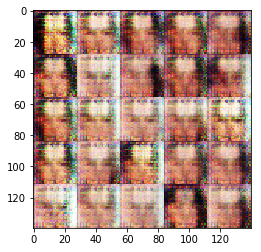


 Epoch 1/1 Step 3800 Discriminator Loss: 1.3633 ...  Generator Loss: 0.7212

 Epoch 1/1 Step 3810 Discriminator Loss: 1.3341 ...  Generator Loss: 0.7455

 Epoch 1/1 Step 3820 Discriminator Loss: 1.4596 ...  Generator Loss: 0.6930

 Epoch 1/1 Step 3830 Discriminator Loss: 1.4029 ...  Generator Loss: 0.6522

 Epoch 1/1 Step 3840 Discriminator Loss: 1.7733 ...  Generator Loss: 0.5053

 Epoch 1/1 Step 3850 Discriminator Loss: 1.8742 ...  Generator Loss: 0.5981

 Epoch 1/1 Step 3860 Discriminator Loss: 1.4871 ...  Generator Loss: 0.6183

 Epoch 1/1 Step 3870 Discriminator Loss: 1.6984 ...  Generator Loss: 0.6102

 Epoch 1/1 Step 3880 Discriminator Loss: 1.5645 ...  Generator Loss: 0.7401

 Epoch 1/1 Step 3890 Discriminator Loss: 1.8511 ...  Generator Loss: 0.6717


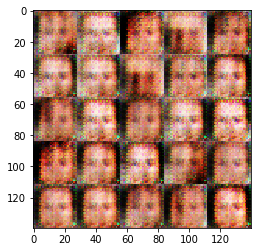


 Epoch 1/1 Step 3900 Discriminator Loss: 1.5587 ...  Generator Loss: 0.6745

 Epoch 1/1 Step 3910 Discriminator Loss: 1.4523 ...  Generator Loss: 0.7537

 Epoch 1/1 Step 3920 Discriminator Loss: 1.4568 ...  Generator Loss: 0.6127

 Epoch 1/1 Step 3930 Discriminator Loss: 1.2831 ...  Generator Loss: 0.8582

 Epoch 1/1 Step 3940 Discriminator Loss: 1.4526 ...  Generator Loss: 0.6778

 Epoch 1/1 Step 3950 Discriminator Loss: 1.5759 ...  Generator Loss: 0.6654

 Epoch 1/1 Step 3960 Discriminator Loss: 1.3601 ...  Generator Loss: 0.8056

 Epoch 1/1 Step 3970 Discriminator Loss: 1.5276 ...  Generator Loss: 0.7135

 Epoch 1/1 Step 3980 Discriminator Loss: 1.4680 ...  Generator Loss: 0.7485

 Epoch 1/1 Step 3990 Discriminator Loss: 1.5358 ...  Generator Loss: 0.6713


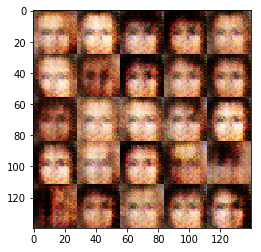


 Epoch 1/1 Step 4000 Discriminator Loss: 1.4892 ...  Generator Loss: 0.6614

 Epoch 1/1 Step 4010 Discriminator Loss: 1.5356 ...  Generator Loss: 0.6656

 Epoch 1/1 Step 4020 Discriminator Loss: 1.5509 ...  Generator Loss: 0.7053

 Epoch 1/1 Step 4030 Discriminator Loss: 1.6199 ...  Generator Loss: 0.7484

 Epoch 1/1 Step 4040 Discriminator Loss: 1.4647 ...  Generator Loss: 0.6471

 Epoch 1/1 Step 4050 Discriminator Loss: 1.5073 ...  Generator Loss: 0.6014

 Epoch 1/1 Step 4060 Discriminator Loss: 1.6023 ...  Generator Loss: 0.6234

 Epoch 1/1 Step 4070 Discriminator Loss: 1.8141 ...  Generator Loss: 0.4579

 Epoch 1/1 Step 4080 Discriminator Loss: 1.9199 ...  Generator Loss: 0.4482

 Epoch 1/1 Step 4090 Discriminator Loss: 1.3758 ...  Generator Loss: 0.9032


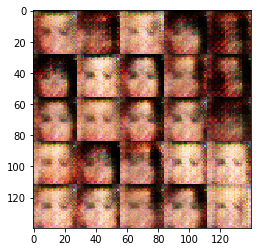


 Epoch 1/1 Step 4100 Discriminator Loss: 1.8962 ...  Generator Loss: 0.5206

 Epoch 1/1 Step 4110 Discriminator Loss: 1.5403 ...  Generator Loss: 0.6317

 Epoch 1/1 Step 4120 Discriminator Loss: 1.6818 ...  Generator Loss: 0.5676

 Epoch 1/1 Step 4130 Discriminator Loss: 1.6069 ...  Generator Loss: 0.5653

 Epoch 1/1 Step 4140 Discriminator Loss: 1.6102 ...  Generator Loss: 0.6653

 Epoch 1/1 Step 4150 Discriminator Loss: 1.3290 ...  Generator Loss: 0.7654

 Epoch 1/1 Step 4160 Discriminator Loss: 1.6335 ...  Generator Loss: 0.5843

 Epoch 1/1 Step 4170 Discriminator Loss: 1.6630 ...  Generator Loss: 0.5306

 Epoch 1/1 Step 4180 Discriminator Loss: 1.4523 ...  Generator Loss: 0.7488

 Epoch 1/1 Step 4190 Discriminator Loss: 1.6742 ...  Generator Loss: 0.5484


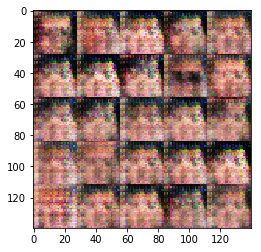


 Epoch 1/1 Step 4200 Discriminator Loss: 1.5259 ...  Generator Loss: 0.6690

 Epoch 1/1 Step 4210 Discriminator Loss: 1.5982 ...  Generator Loss: 0.6520

 Epoch 1/1 Step 4220 Discriminator Loss: 1.5693 ...  Generator Loss: 0.6698

 Epoch 1/1 Step 4230 Discriminator Loss: 1.6437 ...  Generator Loss: 0.5370

 Epoch 1/1 Step 4240 Discriminator Loss: 1.5606 ...  Generator Loss: 0.7024

 Epoch 1/1 Step 4250 Discriminator Loss: 1.5347 ...  Generator Loss: 0.6940

 Epoch 1/1 Step 4260 Discriminator Loss: 1.5233 ...  Generator Loss: 0.5487

 Epoch 1/1 Step 4270 Discriminator Loss: 1.7008 ...  Generator Loss: 0.5392

 Epoch 1/1 Step 4280 Discriminator Loss: 1.6332 ...  Generator Loss: 0.6262

 Epoch 1/1 Step 4290 Discriminator Loss: 1.5364 ...  Generator Loss: 0.6637


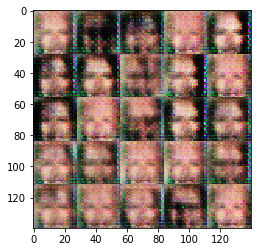


 Epoch 1/1 Step 4300 Discriminator Loss: 1.6503 ...  Generator Loss: 0.6162

 Epoch 1/1 Step 4310 Discriminator Loss: 1.5125 ...  Generator Loss: 0.6394

 Epoch 1/1 Step 4320 Discriminator Loss: 1.3572 ...  Generator Loss: 0.8349

 Epoch 1/1 Step 4330 Discriminator Loss: 1.3618 ...  Generator Loss: 0.8029

 Epoch 1/1 Step 4340 Discriminator Loss: 1.4700 ...  Generator Loss: 0.8024

 Epoch 1/1 Step 4350 Discriminator Loss: 1.5074 ...  Generator Loss: 0.6472

 Epoch 1/1 Step 4360 Discriminator Loss: 1.5434 ...  Generator Loss: 0.6485

 Epoch 1/1 Step 4370 Discriminator Loss: 1.7522 ...  Generator Loss: 0.4494

 Epoch 1/1 Step 4380 Discriminator Loss: 1.3365 ...  Generator Loss: 0.8199

 Epoch 1/1 Step 4390 Discriminator Loss: 2.1234 ...  Generator Loss: 0.3846


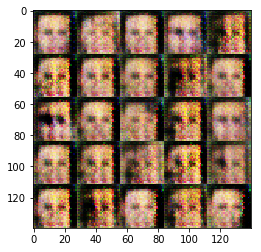


 Epoch 1/1 Step 4400 Discriminator Loss: 1.4673 ...  Generator Loss: 0.6607

 Epoch 1/1 Step 4410 Discriminator Loss: 1.6476 ...  Generator Loss: 0.6379

 Epoch 1/1 Step 4420 Discriminator Loss: 1.5898 ...  Generator Loss: 0.5916

 Epoch 1/1 Step 4430 Discriminator Loss: 1.5712 ...  Generator Loss: 0.6134

 Epoch 1/1 Step 4440 Discriminator Loss: 1.4974 ...  Generator Loss: 0.6304

 Epoch 1/1 Step 4450 Discriminator Loss: 1.6264 ...  Generator Loss: 0.6710

 Epoch 1/1 Step 4460 Discriminator Loss: 1.7406 ...  Generator Loss: 0.5176

 Epoch 1/1 Step 4470 Discriminator Loss: 1.4864 ...  Generator Loss: 0.6469

 Epoch 1/1 Step 4480 Discriminator Loss: 1.6834 ...  Generator Loss: 0.4765

 Epoch 1/1 Step 4490 Discriminator Loss: 1.8629 ...  Generator Loss: 0.4718


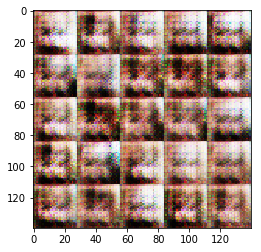


 Epoch 1/1 Step 4500 Discriminator Loss: 1.6798 ...  Generator Loss: 0.5228

 Epoch 1/1 Step 4510 Discriminator Loss: 1.4736 ...  Generator Loss: 0.6128

 Epoch 1/1 Step 4520 Discriminator Loss: 1.3516 ...  Generator Loss: 0.9891

 Epoch 1/1 Step 4530 Discriminator Loss: 1.7391 ...  Generator Loss: 0.5122

 Epoch 1/1 Step 4540 Discriminator Loss: 1.4667 ...  Generator Loss: 0.7457

 Epoch 1/1 Step 4550 Discriminator Loss: 1.7038 ...  Generator Loss: 0.6566

 Epoch 1/1 Step 4560 Discriminator Loss: 1.3694 ...  Generator Loss: 0.7426

 Epoch 1/1 Step 4570 Discriminator Loss: 1.4847 ...  Generator Loss: 0.6449

 Epoch 1/1 Step 4580 Discriminator Loss: 1.6242 ...  Generator Loss: 0.5447

 Epoch 1/1 Step 4590 Discriminator Loss: 1.8678 ...  Generator Loss: 0.5817


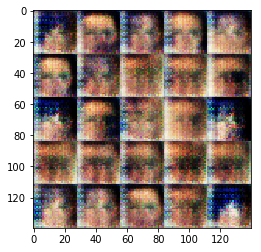


 Epoch 1/1 Step 4600 Discriminator Loss: 1.6065 ...  Generator Loss: 0.5433

 Epoch 1/1 Step 4610 Discriminator Loss: 1.5365 ...  Generator Loss: 0.7288

 Epoch 1/1 Step 4620 Discriminator Loss: 1.4888 ...  Generator Loss: 0.8173

 Epoch 1/1 Step 4630 Discriminator Loss: 1.5465 ...  Generator Loss: 0.6078

 Epoch 1/1 Step 4640 Discriminator Loss: 1.6996 ...  Generator Loss: 0.6173

 Epoch 1/1 Step 4650 Discriminator Loss: 1.5124 ...  Generator Loss: 0.6384

 Epoch 1/1 Step 4660 Discriminator Loss: 1.6517 ...  Generator Loss: 0.5980

 Epoch 1/1 Step 4670 Discriminator Loss: 1.5304 ...  Generator Loss: 0.6892

 Epoch 1/1 Step 4680 Discriminator Loss: 1.4994 ...  Generator Loss: 0.7137

 Epoch 1/1 Step 4690 Discriminator Loss: 1.5514 ...  Generator Loss: 0.5911


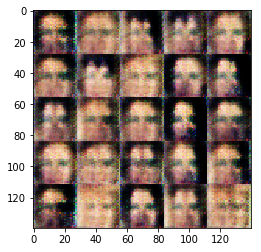


 Epoch 1/1 Step 4700 Discriminator Loss: 1.6023 ...  Generator Loss: 0.5839

 Epoch 1/1 Step 4710 Discriminator Loss: 1.5403 ...  Generator Loss: 0.7319

 Epoch 1/1 Step 4720 Discriminator Loss: 1.4562 ...  Generator Loss: 0.8678

 Epoch 1/1 Step 4730 Discriminator Loss: 1.6080 ...  Generator Loss: 0.6448

 Epoch 1/1 Step 4740 Discriminator Loss: 1.5266 ...  Generator Loss: 0.5433

 Epoch 1/1 Step 4750 Discriminator Loss: 1.5857 ...  Generator Loss: 0.6828

 Epoch 1/1 Step 4760 Discriminator Loss: 1.3692 ...  Generator Loss: 0.9380

 Epoch 1/1 Step 4770 Discriminator Loss: 1.4295 ...  Generator Loss: 0.6930

 Epoch 1/1 Step 4780 Discriminator Loss: 1.7044 ...  Generator Loss: 0.5318

 Epoch 1/1 Step 4790 Discriminator Loss: 1.5405 ...  Generator Loss: 0.6736


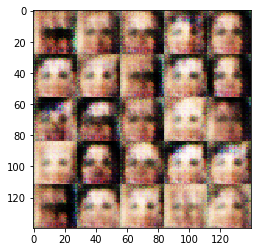


 Epoch 1/1 Step 4800 Discriminator Loss: 1.4508 ...  Generator Loss: 0.6831

 Epoch 1/1 Step 4810 Discriminator Loss: 1.4757 ...  Generator Loss: 0.7062

 Epoch 1/1 Step 4820 Discriminator Loss: 1.5571 ...  Generator Loss: 0.5757

 Epoch 1/1 Step 4830 Discriminator Loss: 1.5561 ...  Generator Loss: 0.5734

 Epoch 1/1 Step 4840 Discriminator Loss: 1.4254 ...  Generator Loss: 0.8274

 Epoch 1/1 Step 4850 Discriminator Loss: 1.6342 ...  Generator Loss: 0.5781

 Epoch 1/1 Step 4860 Discriminator Loss: 1.6940 ...  Generator Loss: 0.6063

 Epoch 1/1 Step 4870 Discriminator Loss: 1.5187 ...  Generator Loss: 0.7216

 Epoch 1/1 Step 4880 Discriminator Loss: 1.6791 ...  Generator Loss: 0.5395

 Epoch 1/1 Step 4890 Discriminator Loss: 1.6577 ...  Generator Loss: 0.5472


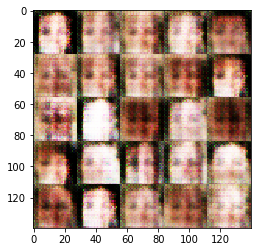


 Epoch 1/1 Step 4900 Discriminator Loss: 1.3782 ...  Generator Loss: 0.7036

 Epoch 1/1 Step 4910 Discriminator Loss: 1.3914 ...  Generator Loss: 0.6847

 Epoch 1/1 Step 4920 Discriminator Loss: 1.4825 ...  Generator Loss: 0.6432

 Epoch 1/1 Step 4930 Discriminator Loss: 1.6326 ...  Generator Loss: 0.7528

 Epoch 1/1 Step 4940 Discriminator Loss: 1.3558 ...  Generator Loss: 0.7611

 Epoch 1/1 Step 4950 Discriminator Loss: 1.6962 ...  Generator Loss: 0.5536

 Epoch 1/1 Step 4960 Discriminator Loss: 1.4406 ...  Generator Loss: 0.6478

 Epoch 1/1 Step 4970 Discriminator Loss: 1.4941 ...  Generator Loss: 0.6771

 Epoch 1/1 Step 4980 Discriminator Loss: 1.6456 ...  Generator Loss: 0.6358

 Epoch 1/1 Step 4990 Discriminator Loss: 1.4906 ...  Generator Loss: 0.6542


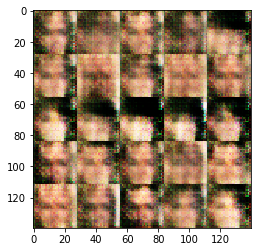


 Epoch 1/1 Step 5000 Discriminator Loss: 1.4618 ...  Generator Loss: 0.7506

 Epoch 1/1 Step 5010 Discriminator Loss: 1.3454 ...  Generator Loss: 0.8532

 Epoch 1/1 Step 5020 Discriminator Loss: 1.4031 ...  Generator Loss: 0.7898

 Epoch 1/1 Step 5030 Discriminator Loss: 1.5028 ...  Generator Loss: 0.6854

 Epoch 1/1 Step 5040 Discriminator Loss: 1.6272 ...  Generator Loss: 0.6256

 Epoch 1/1 Step 5050 Discriminator Loss: 1.4166 ...  Generator Loss: 0.6880

 Epoch 1/1 Step 5060 Discriminator Loss: 1.5160 ...  Generator Loss: 0.6392

 Epoch 1/1 Step 5070 Discriminator Loss: 1.5514 ...  Generator Loss: 0.6189

 Epoch 1/1 Step 5080 Discriminator Loss: 1.5966 ...  Generator Loss: 0.5804

 Epoch 1/1 Step 5090 Discriminator Loss: 1.7890 ...  Generator Loss: 0.5282


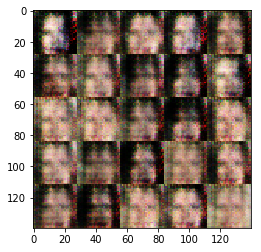


 Epoch 1/1 Step 5100 Discriminator Loss: 1.6660 ...  Generator Loss: 0.6007

 Epoch 1/1 Step 5110 Discriminator Loss: 1.2412 ...  Generator Loss: 0.8899

 Epoch 1/1 Step 5120 Discriminator Loss: 1.5942 ...  Generator Loss: 0.6335

 Epoch 1/1 Step 5130 Discriminator Loss: 1.6349 ...  Generator Loss: 0.6627

 Epoch 1/1 Step 5140 Discriminator Loss: 1.3882 ...  Generator Loss: 0.7324

 Epoch 1/1 Step 5150 Discriminator Loss: 1.4833 ...  Generator Loss: 0.6532

 Epoch 1/1 Step 5160 Discriminator Loss: 1.6220 ...  Generator Loss: 0.5877

 Epoch 1/1 Step 5170 Discriminator Loss: 1.4615 ...  Generator Loss: 0.7351

 Epoch 1/1 Step 5180 Discriminator Loss: 1.4920 ...  Generator Loss: 0.6864

 Epoch 1/1 Step 5190 Discriminator Loss: 1.5234 ...  Generator Loss: 0.7087


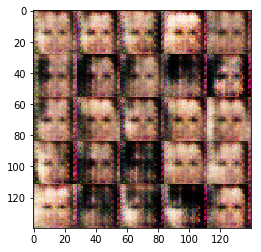


 Epoch 1/1 Step 5200 Discriminator Loss: 1.5505 ...  Generator Loss: 0.6802

 Epoch 1/1 Step 5210 Discriminator Loss: 1.4549 ...  Generator Loss: 0.7558

 Epoch 1/1 Step 5220 Discriminator Loss: 1.4205 ...  Generator Loss: 0.6594

 Epoch 1/1 Step 5230 Discriminator Loss: 1.6531 ...  Generator Loss: 0.5602

 Epoch 1/1 Step 5240 Discriminator Loss: 1.4800 ...  Generator Loss: 0.7080

 Epoch 1/1 Step 5250 Discriminator Loss: 1.4038 ...  Generator Loss: 0.7291

 Epoch 1/1 Step 5260 Discriminator Loss: 1.4957 ...  Generator Loss: 0.6194

 Epoch 1/1 Step 5270 Discriminator Loss: 1.3870 ...  Generator Loss: 0.7324

 Epoch 1/1 Step 5280 Discriminator Loss: 1.7787 ...  Generator Loss: 0.5612

 Epoch 1/1 Step 5290 Discriminator Loss: 1.4996 ...  Generator Loss: 0.6793


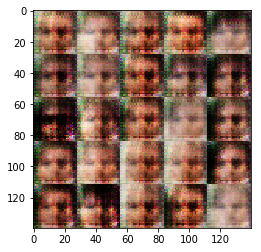


 Epoch 1/1 Step 5300 Discriminator Loss: 1.5242 ...  Generator Loss: 0.7026

 Epoch 1/1 Step 5310 Discriminator Loss: 1.5609 ...  Generator Loss: 0.6135

 Epoch 1/1 Step 5320 Discriminator Loss: 1.4724 ...  Generator Loss: 0.6536

 Epoch 1/1 Step 5330 Discriminator Loss: 1.4540 ...  Generator Loss: 0.6892

 Epoch 1/1 Step 5340 Discriminator Loss: 1.5401 ...  Generator Loss: 0.6906

 Epoch 1/1 Step 5350 Discriminator Loss: 1.3655 ...  Generator Loss: 0.7431

 Epoch 1/1 Step 5360 Discriminator Loss: 1.3488 ...  Generator Loss: 0.7860

 Epoch 1/1 Step 5370 Discriminator Loss: 1.5171 ...  Generator Loss: 0.7472

 Epoch 1/1 Step 5380 Discriminator Loss: 1.4206 ...  Generator Loss: 0.6463

 Epoch 1/1 Step 5390 Discriminator Loss: 1.6077 ...  Generator Loss: 0.5677


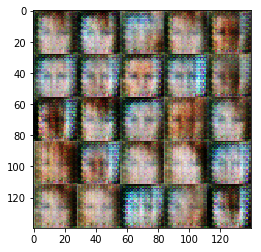


 Epoch 1/1 Step 5400 Discriminator Loss: 1.5877 ...  Generator Loss: 0.6416

 Epoch 1/1 Step 5410 Discriminator Loss: 1.6098 ...  Generator Loss: 0.6791

 Epoch 1/1 Step 5420 Discriminator Loss: 1.5053 ...  Generator Loss: 0.7140

 Epoch 1/1 Step 5430 Discriminator Loss: 1.7095 ...  Generator Loss: 0.4901

 Epoch 1/1 Step 5440 Discriminator Loss: 1.8583 ...  Generator Loss: 0.4708

 Epoch 1/1 Step 5450 Discriminator Loss: 1.6343 ...  Generator Loss: 0.5329

 Epoch 1/1 Step 5460 Discriminator Loss: 1.5082 ...  Generator Loss: 0.8382

 Epoch 1/1 Step 5470 Discriminator Loss: 1.5149 ...  Generator Loss: 0.6700

 Epoch 1/1 Step 5480 Discriminator Loss: 1.4921 ...  Generator Loss: 0.6871

 Epoch 1/1 Step 5490 Discriminator Loss: 1.4353 ...  Generator Loss: 0.7358


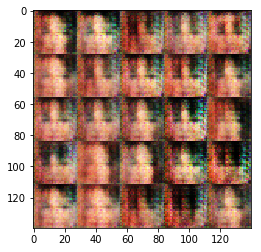


 Epoch 1/1 Step 5500 Discriminator Loss: 1.5157 ...  Generator Loss: 0.6709

 Epoch 1/1 Step 5510 Discriminator Loss: 1.6144 ...  Generator Loss: 0.5892

 Epoch 1/1 Step 5520 Discriminator Loss: 1.5479 ...  Generator Loss: 0.6254

 Epoch 1/1 Step 5530 Discriminator Loss: 1.4765 ...  Generator Loss: 0.6467

 Epoch 1/1 Step 5540 Discriminator Loss: 1.3339 ...  Generator Loss: 0.6996

 Epoch 1/1 Step 5550 Discriminator Loss: 1.4480 ...  Generator Loss: 0.7310

 Epoch 1/1 Step 5560 Discriminator Loss: 1.3310 ...  Generator Loss: 0.9448

 Epoch 1/1 Step 5570 Discriminator Loss: 1.4599 ...  Generator Loss: 0.6693

 Epoch 1/1 Step 5580 Discriminator Loss: 1.5767 ...  Generator Loss: 0.7459

 Epoch 1/1 Step 5590 Discriminator Loss: 1.4100 ...  Generator Loss: 0.6310


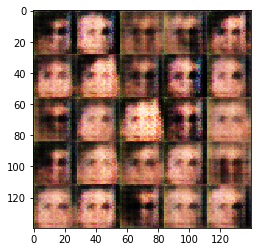


 Epoch 1/1 Step 5600 Discriminator Loss: 1.3983 ...  Generator Loss: 0.7350

 Epoch 1/1 Step 5610 Discriminator Loss: 1.5826 ...  Generator Loss: 0.6686

 Epoch 1/1 Step 5620 Discriminator Loss: 1.4795 ...  Generator Loss: 0.7400

 Epoch 1/1 Step 5630 Discriminator Loss: 1.3573 ...  Generator Loss: 0.7262

 Epoch 1/1 Step 5640 Discriminator Loss: 1.4917 ...  Generator Loss: 0.6419

 Epoch 1/1 Step 5650 Discriminator Loss: 1.4166 ...  Generator Loss: 0.6991

 Epoch 1/1 Step 5660 Discriminator Loss: 1.2568 ...  Generator Loss: 0.8168

 Epoch 1/1 Step 5670 Discriminator Loss: 1.5039 ...  Generator Loss: 0.7168

 Epoch 1/1 Step 5680 Discriminator Loss: 1.4049 ...  Generator Loss: 0.7916

 Epoch 1/1 Step 5690 Discriminator Loss: 1.5166 ...  Generator Loss: 0.6554


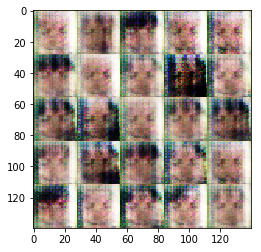


 Epoch 1/1 Step 5700 Discriminator Loss: 1.5195 ...  Generator Loss: 0.5903

 Epoch 1/1 Step 5710 Discriminator Loss: 1.4352 ...  Generator Loss: 0.6757

 Epoch 1/1 Step 5720 Discriminator Loss: 1.4195 ...  Generator Loss: 0.7774

 Epoch 1/1 Step 5730 Discriminator Loss: 1.4806 ...  Generator Loss: 0.7312

 Epoch 1/1 Step 5740 Discriminator Loss: 1.3856 ...  Generator Loss: 0.7146

 Epoch 1/1 Step 5750 Discriminator Loss: 1.7192 ...  Generator Loss: 0.5080

 Epoch 1/1 Step 5760 Discriminator Loss: 1.5144 ...  Generator Loss: 0.6837

 Epoch 1/1 Step 5770 Discriminator Loss: 1.4687 ...  Generator Loss: 0.7213

 Epoch 1/1 Step 5780 Discriminator Loss: 1.4560 ...  Generator Loss: 0.6602

 Epoch 1/1 Step 5790 Discriminator Loss: 1.4968 ...  Generator Loss: 0.6564


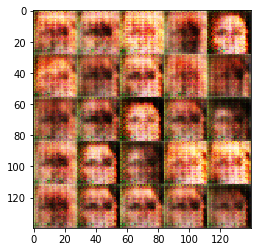


 Epoch 1/1 Step 5800 Discriminator Loss: 1.6580 ...  Generator Loss: 0.5693

 Epoch 1/1 Step 5810 Discriminator Loss: 1.5680 ...  Generator Loss: 0.6717

 Epoch 1/1 Step 5820 Discriminator Loss: 1.4890 ...  Generator Loss: 0.6372

 Epoch 1/1 Step 5830 Discriminator Loss: 1.6991 ...  Generator Loss: 0.6499

 Epoch 1/1 Step 5840 Discriminator Loss: 1.5524 ...  Generator Loss: 0.7282

 Epoch 1/1 Step 5850 Discriminator Loss: 1.3581 ...  Generator Loss: 0.8516

 Epoch 1/1 Step 5860 Discriminator Loss: 1.4100 ...  Generator Loss: 0.7375

 Epoch 1/1 Step 5870 Discriminator Loss: 1.3546 ...  Generator Loss: 0.7037

 Epoch 1/1 Step 5880 Discriminator Loss: 1.4497 ...  Generator Loss: 0.6913

 Epoch 1/1 Step 5890 Discriminator Loss: 1.6710 ...  Generator Loss: 0.7721


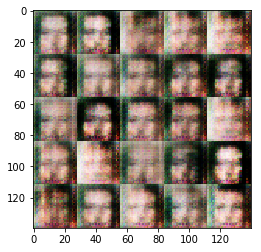


 Epoch 1/1 Step 5900 Discriminator Loss: 1.3145 ...  Generator Loss: 0.7807

 Epoch 1/1 Step 5910 Discriminator Loss: 1.3792 ...  Generator Loss: 0.7970

 Epoch 1/1 Step 5920 Discriminator Loss: 1.4642 ...  Generator Loss: 0.6982

 Epoch 1/1 Step 5930 Discriminator Loss: 1.5871 ...  Generator Loss: 0.6088

 Epoch 1/1 Step 5940 Discriminator Loss: 1.4849 ...  Generator Loss: 0.6333

 Epoch 1/1 Step 5950 Discriminator Loss: 1.5667 ...  Generator Loss: 0.6805

 Epoch 1/1 Step 5960 Discriminator Loss: 1.6174 ...  Generator Loss: 0.6227

 Epoch 1/1 Step 5970 Discriminator Loss: 1.5240 ...  Generator Loss: 0.6319

 Epoch 1/1 Step 5980 Discriminator Loss: 1.5079 ...  Generator Loss: 0.6716

 Epoch 1/1 Step 5990 Discriminator Loss: 1.4347 ...  Generator Loss: 0.5737


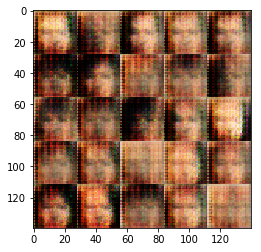


 Epoch 1/1 Step 6000 Discriminator Loss: 1.4412 ...  Generator Loss: 0.6728

 Epoch 1/1 Step 6010 Discriminator Loss: 1.7727 ...  Generator Loss: 0.6126

 Epoch 1/1 Step 6020 Discriminator Loss: 1.5603 ...  Generator Loss: 0.6281

 Epoch 1/1 Step 6030 Discriminator Loss: 1.3442 ...  Generator Loss: 0.7726

 Epoch 1/1 Step 6040 Discriminator Loss: 1.8135 ...  Generator Loss: 0.5452

 Epoch 1/1 Step 6050 Discriminator Loss: 1.5890 ...  Generator Loss: 0.6020

 Epoch 1/1 Step 6060 Discriminator Loss: 1.5026 ...  Generator Loss: 0.7122

 Epoch 1/1 Step 6070 Discriminator Loss: 1.4985 ...  Generator Loss: 0.7467

 Epoch 1/1 Step 6080 Discriminator Loss: 1.5207 ...  Generator Loss: 0.6334

 Epoch 1/1 Step 6090 Discriminator Loss: 1.4430 ...  Generator Loss: 0.7984


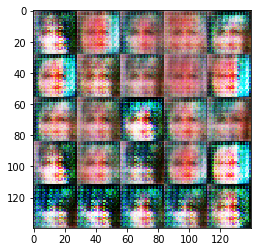


 Epoch 1/1 Step 6100 Discriminator Loss: 1.5848 ...  Generator Loss: 0.6219

 Epoch 1/1 Step 6110 Discriminator Loss: 1.5253 ...  Generator Loss: 0.7094

 Epoch 1/1 Step 6120 Discriminator Loss: 1.7448 ...  Generator Loss: 0.5297

 Epoch 1/1 Step 6130 Discriminator Loss: 1.4030 ...  Generator Loss: 0.6410

 Epoch 1/1 Step 6140 Discriminator Loss: 1.4609 ...  Generator Loss: 0.6881

 Epoch 1/1 Step 6150 Discriminator Loss: 1.5725 ...  Generator Loss: 0.6080

 Epoch 1/1 Step 6160 Discriminator Loss: 1.5318 ...  Generator Loss: 0.6895

 Epoch 1/1 Step 6170 Discriminator Loss: 1.2977 ...  Generator Loss: 0.9292

 Epoch 1/1 Step 6180 Discriminator Loss: 1.5428 ...  Generator Loss: 0.4678

 Epoch 1/1 Step 6190 Discriminator Loss: 1.5198 ...  Generator Loss: 0.6637


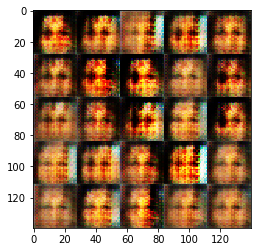


 Epoch 1/1 Step 6200 Discriminator Loss: 1.5834 ...  Generator Loss: 0.6770

 Epoch 1/1 Step 6210 Discriminator Loss: 1.3617 ...  Generator Loss: 0.8471

 Epoch 1/1 Step 6220 Discriminator Loss: 1.5049 ...  Generator Loss: 0.7148

 Epoch 1/1 Step 6230 Discriminator Loss: 1.6983 ...  Generator Loss: 0.5872

 Epoch 1/1 Step 6240 Discriminator Loss: 1.9781 ...  Generator Loss: 0.5259

 Epoch 1/1 Step 6250 Discriminator Loss: 1.2861 ...  Generator Loss: 0.8057

 Epoch 1/1 Step 6260 Discriminator Loss: 1.1648 ...  Generator Loss: 0.8565

 Epoch 1/1 Step 6270 Discriminator Loss: 1.3900 ...  Generator Loss: 0.7380

 Epoch 1/1 Step 6280 Discriminator Loss: 1.4908 ...  Generator Loss: 0.6156

 Epoch 1/1 Step 6290 Discriminator Loss: 1.4531 ...  Generator Loss: 0.6278


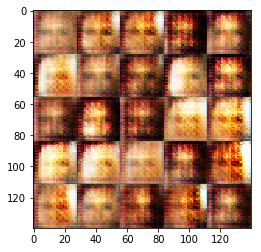


 Epoch 1/1 Step 6300 Discriminator Loss: 1.7008 ...  Generator Loss: 0.5118

 Epoch 1/1 Step 6310 Discriminator Loss: 1.7110 ...  Generator Loss: 0.5218

 Epoch 1/1 Step 6320 Discriminator Loss: 1.2536 ...  Generator Loss: 0.7708

 Epoch 1/1 Step 6330 Discriminator Loss: 1.6411 ...  Generator Loss: 0.7354

 Epoch 1/1 Step 6340 Discriminator Loss: 1.4312 ...  Generator Loss: 0.6344

 Epoch 1/1 Step 6350 Discriminator Loss: 1.6984 ...  Generator Loss: 0.6633

 Epoch 1/1 Step 6360 Discriminator Loss: 1.7864 ...  Generator Loss: 0.5153

 Epoch 1/1 Step 6370 Discriminator Loss: 1.6311 ...  Generator Loss: 0.5745

 Epoch 1/1 Step 6380 Discriminator Loss: 1.3561 ...  Generator Loss: 0.8061

 Epoch 1/1 Step 6390 Discriminator Loss: 1.4291 ...  Generator Loss: 0.6962


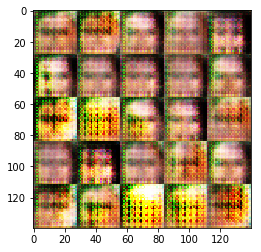


 Epoch 1/1 Step 6400 Discriminator Loss: 1.3642 ...  Generator Loss: 0.7747

 Epoch 1/1 Step 6410 Discriminator Loss: 1.5635 ...  Generator Loss: 0.5744

 Epoch 1/1 Step 6420 Discriminator Loss: 1.3951 ...  Generator Loss: 0.7383

 Epoch 1/1 Step 6430 Discriminator Loss: 1.5424 ...  Generator Loss: 0.7554

 Epoch 1/1 Step 6440 Discriminator Loss: 1.5012 ...  Generator Loss: 0.6425

 Epoch 1/1 Step 6450 Discriminator Loss: 1.2054 ...  Generator Loss: 0.8826

 Epoch 1/1 Step 6460 Discriminator Loss: 1.7368 ...  Generator Loss: 0.7588

 Epoch 1/1 Step 6470 Discriminator Loss: 1.8754 ...  Generator Loss: 0.5555

 Epoch 1/1 Step 6480 Discriminator Loss: 1.3733 ...  Generator Loss: 0.6918

 Epoch 1/1 Step 6490 Discriminator Loss: 1.5386 ...  Generator Loss: 0.5886


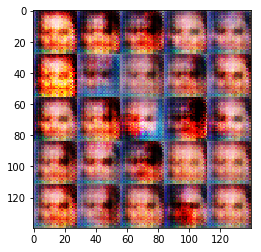


 Epoch 1/1 Step 6500 Discriminator Loss: 1.5587 ...  Generator Loss: 0.6672

 Epoch 1/1 Step 6510 Discriminator Loss: 1.3949 ...  Generator Loss: 0.7643

 Epoch 1/1 Step 6520 Discriminator Loss: 1.5354 ...  Generator Loss: 0.8253

 Epoch 1/1 Step 6530 Discriminator Loss: 1.3464 ...  Generator Loss: 0.7714

 Epoch 1/1 Step 6540 Discriminator Loss: 1.4698 ...  Generator Loss: 0.6918

 Epoch 1/1 Step 6550 Discriminator Loss: 1.3698 ...  Generator Loss: 0.7080

 Epoch 1/1 Step 6560 Discriminator Loss: 1.3209 ...  Generator Loss: 0.7588

 Epoch 1/1 Step 6570 Discriminator Loss: 1.4849 ...  Generator Loss: 0.6030

 Epoch 1/1 Step 6580 Discriminator Loss: 1.3350 ...  Generator Loss: 0.8791

 Epoch 1/1 Step 6590 Discriminator Loss: 1.6101 ...  Generator Loss: 0.7703


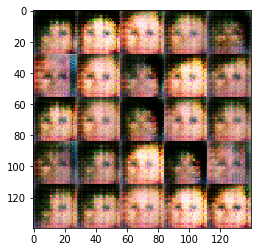


 Epoch 1/1 Step 6600 Discriminator Loss: 1.4147 ...  Generator Loss: 0.8153

 Epoch 1/1 Step 6610 Discriminator Loss: 1.2607 ...  Generator Loss: 0.8197

 Epoch 1/1 Step 6620 Discriminator Loss: 1.5269 ...  Generator Loss: 0.6206

 Epoch 1/1 Step 6630 Discriminator Loss: 1.5264 ...  Generator Loss: 0.7347

 Epoch 1/1 Step 6640 Discriminator Loss: 1.7365 ...  Generator Loss: 0.5517

 Epoch 1/1 Step 6650 Discriminator Loss: 1.7222 ...  Generator Loss: 0.5549

 Epoch 1/1 Step 6660 Discriminator Loss: 1.8029 ...  Generator Loss: 0.6625

 Epoch 1/1 Step 6670 Discriminator Loss: 1.7037 ...  Generator Loss: 0.5104

 Epoch 1/1 Step 6680 Discriminator Loss: 1.4044 ...  Generator Loss: 0.6576

 Epoch 1/1 Step 6690 Discriminator Loss: 1.4855 ...  Generator Loss: 0.7150


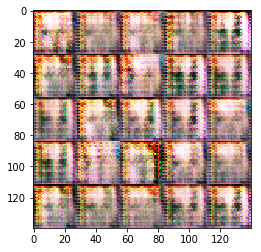


 Epoch 1/1 Step 6700 Discriminator Loss: 1.5763 ...  Generator Loss: 0.6486

 Epoch 1/1 Step 6710 Discriminator Loss: 1.6315 ...  Generator Loss: 0.6058

 Epoch 1/1 Step 6720 Discriminator Loss: 1.5973 ...  Generator Loss: 0.6508

 Epoch 1/1 Step 6730 Discriminator Loss: 1.7328 ...  Generator Loss: 0.5757

 Epoch 1/1 Step 6740 Discriminator Loss: 1.5838 ...  Generator Loss: 0.6672

 Epoch 1/1 Step 6750 Discriminator Loss: 1.5094 ...  Generator Loss: 0.6025

 Epoch 1/1 Step 6760 Discriminator Loss: 1.3674 ...  Generator Loss: 0.7771

 Epoch 1/1 Step 6770 Discriminator Loss: 1.5419 ...  Generator Loss: 0.5795

 Epoch 1/1 Step 6780 Discriminator Loss: 1.4685 ...  Generator Loss: 0.5755

 Epoch 1/1 Step 6790 Discriminator Loss: 1.5283 ...  Generator Loss: 0.6310


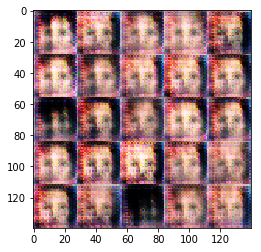


 Epoch 1/1 Step 6800 Discriminator Loss: 1.3902 ...  Generator Loss: 0.8182

 Epoch 1/1 Step 6810 Discriminator Loss: 1.5683 ...  Generator Loss: 0.6445

 Epoch 1/1 Step 6820 Discriminator Loss: 1.7122 ...  Generator Loss: 0.4501

 Epoch 1/1 Step 6830 Discriminator Loss: 1.3671 ...  Generator Loss: 0.7101

 Epoch 1/1 Step 6840 Discriminator Loss: 1.3890 ...  Generator Loss: 0.6996

 Epoch 1/1 Step 6850 Discriminator Loss: 1.4243 ...  Generator Loss: 0.6258

 Epoch 1/1 Step 6860 Discriminator Loss: 1.3377 ...  Generator Loss: 0.6772

 Epoch 1/1 Step 6870 Discriminator Loss: 1.6918 ...  Generator Loss: 0.7272

 Epoch 1/1 Step 6880 Discriminator Loss: 1.4970 ...  Generator Loss: 0.5914

 Epoch 1/1 Step 6890 Discriminator Loss: 1.7919 ...  Generator Loss: 0.5555


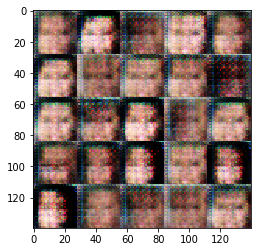


 Epoch 1/1 Step 6900 Discriminator Loss: 1.5328 ...  Generator Loss: 0.6335

 Epoch 1/1 Step 6910 Discriminator Loss: 1.4757 ...  Generator Loss: 0.7211

 Epoch 1/1 Step 6920 Discriminator Loss: 1.4101 ...  Generator Loss: 0.7811

 Epoch 1/1 Step 6930 Discriminator Loss: 1.4637 ...  Generator Loss: 0.7696

 Epoch 1/1 Step 6940 Discriminator Loss: 1.5386 ...  Generator Loss: 0.6938

 Epoch 1/1 Step 6950 Discriminator Loss: 1.4970 ...  Generator Loss: 0.6510

 Epoch 1/1 Step 6960 Discriminator Loss: 1.8255 ...  Generator Loss: 0.4575

 Epoch 1/1 Step 6970 Discriminator Loss: 1.4714 ...  Generator Loss: 0.7002

 Epoch 1/1 Step 6980 Discriminator Loss: 1.5370 ...  Generator Loss: 0.7677

 Epoch 1/1 Step 6990 Discriminator Loss: 1.6171 ...  Generator Loss: 0.6044


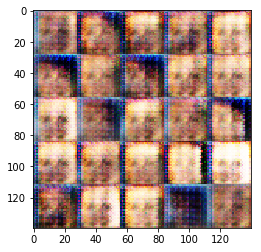


 Epoch 1/1 Step 7000 Discriminator Loss: 1.6758 ...  Generator Loss: 0.5981

 Epoch 1/1 Step 7010 Discriminator Loss: 1.5690 ...  Generator Loss: 0.5561

 Epoch 1/1 Step 7020 Discriminator Loss: 1.4271 ...  Generator Loss: 0.7478

 Epoch 1/1 Step 7030 Discriminator Loss: 1.6056 ...  Generator Loss: 0.7236

 Epoch 1/1 Step 7040 Discriminator Loss: 1.5086 ...  Generator Loss: 0.6797

 Epoch 1/1 Step 7050 Discriminator Loss: 1.5085 ...  Generator Loss: 0.6830

 Epoch 1/1 Step 7060 Discriminator Loss: 1.6311 ...  Generator Loss: 0.5055

 Epoch 1/1 Step 7070 Discriminator Loss: 1.4378 ...  Generator Loss: 0.7501

 Epoch 1/1 Step 7080 Discriminator Loss: 1.3977 ...  Generator Loss: 0.8046

 Epoch 1/1 Step 7090 Discriminator Loss: 1.3766 ...  Generator Loss: 0.8152


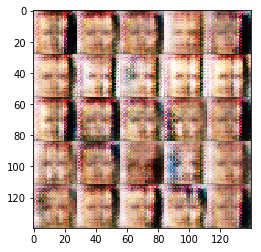


 Epoch 1/1 Step 7100 Discriminator Loss: 1.4453 ...  Generator Loss: 0.8524

 Epoch 1/1 Step 7110 Discriminator Loss: 1.6782 ...  Generator Loss: 0.6957

 Epoch 1/1 Step 7120 Discriminator Loss: 1.4808 ...  Generator Loss: 0.5986

 Epoch 1/1 Step 7130 Discriminator Loss: 1.7422 ...  Generator Loss: 0.5797

 Epoch 1/1 Step 7140 Discriminator Loss: 1.4982 ...  Generator Loss: 0.6981

 Epoch 1/1 Step 7150 Discriminator Loss: 1.6104 ...  Generator Loss: 0.7054

 Epoch 1/1 Step 7160 Discriminator Loss: 1.6183 ...  Generator Loss: 0.5199

 Epoch 1/1 Step 7170 Discriminator Loss: 1.5055 ...  Generator Loss: 0.7502

 Epoch 1/1 Step 7180 Discriminator Loss: 1.3904 ...  Generator Loss: 0.7372

 Epoch 1/1 Step 7190 Discriminator Loss: 1.4541 ...  Generator Loss: 0.8515


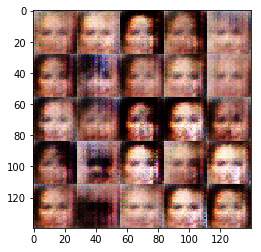


 Epoch 1/1 Step 7200 Discriminator Loss: 1.5390 ...  Generator Loss: 0.6244

 Epoch 1/1 Step 7210 Discriminator Loss: 1.5882 ...  Generator Loss: 0.6006

 Epoch 1/1 Step 7220 Discriminator Loss: 1.6362 ...  Generator Loss: 0.5588

 Epoch 1/1 Step 7230 Discriminator Loss: 1.5543 ...  Generator Loss: 0.6106

 Epoch 1/1 Step 7240 Discriminator Loss: 1.5889 ...  Generator Loss: 0.7601

 Epoch 1/1 Step 7250 Discriminator Loss: 1.6086 ...  Generator Loss: 0.6561

 Epoch 1/1 Step 7260 Discriminator Loss: 1.4748 ...  Generator Loss: 0.7210

 Epoch 1/1 Step 7270 Discriminator Loss: 1.4856 ...  Generator Loss: 0.7244

 Epoch 1/1 Step 7280 Discriminator Loss: 1.6212 ...  Generator Loss: 0.6659

 Epoch 1/1 Step 7290 Discriminator Loss: 1.4233 ...  Generator Loss: 0.7513


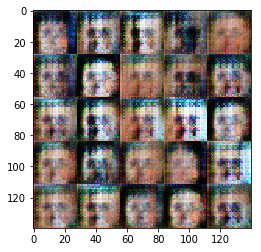


 Epoch 1/1 Step 7300 Discriminator Loss: 1.6325 ...  Generator Loss: 0.6332

 Epoch 1/1 Step 7310 Discriminator Loss: 1.4111 ...  Generator Loss: 0.6717

 Epoch 1/1 Step 7320 Discriminator Loss: 1.4820 ...  Generator Loss: 0.6322

 Epoch 1/1 Step 7330 Discriminator Loss: 1.4636 ...  Generator Loss: 0.7248

 Epoch 1/1 Step 7340 Discriminator Loss: 1.5448 ...  Generator Loss: 0.7070

 Epoch 1/1 Step 7350 Discriminator Loss: 1.4368 ...  Generator Loss: 0.7285

 Epoch 1/1 Step 7360 Discriminator Loss: 1.4957 ...  Generator Loss: 0.6888

 Epoch 1/1 Step 7370 Discriminator Loss: 1.3984 ...  Generator Loss: 0.7348

 Epoch 1/1 Step 7380 Discriminator Loss: 1.3966 ...  Generator Loss: 0.5971

 Epoch 1/1 Step 7390 Discriminator Loss: 1.4112 ...  Generator Loss: 0.6263


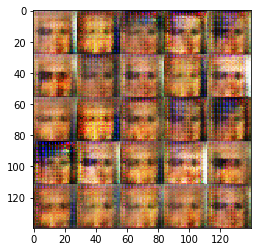


 Epoch 1/1 Step 7400 Discriminator Loss: 1.6364 ...  Generator Loss: 0.5401

 Epoch 1/1 Step 7410 Discriminator Loss: 1.7272 ...  Generator Loss: 0.5406

 Epoch 1/1 Step 7420 Discriminator Loss: 1.4426 ...  Generator Loss: 0.6963

 Epoch 1/1 Step 7430 Discriminator Loss: 1.5650 ...  Generator Loss: 0.6159

 Epoch 1/1 Step 7440 Discriminator Loss: 1.6228 ...  Generator Loss: 0.6007

 Epoch 1/1 Step 7450 Discriminator Loss: 1.6590 ...  Generator Loss: 0.5897

 Epoch 1/1 Step 7460 Discriminator Loss: 1.7320 ...  Generator Loss: 0.4502

 Epoch 1/1 Step 7470 Discriminator Loss: 1.4892 ...  Generator Loss: 0.7202

 Epoch 1/1 Step 7480 Discriminator Loss: 1.5378 ...  Generator Loss: 0.6944

 Epoch 1/1 Step 7490 Discriminator Loss: 1.4528 ...  Generator Loss: 0.7438


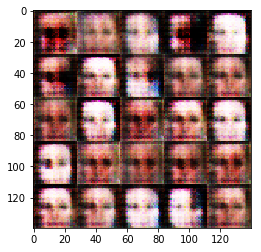


 Epoch 1/1 Step 7500 Discriminator Loss: 1.4896 ...  Generator Loss: 0.5991

 Epoch 1/1 Step 7510 Discriminator Loss: 1.4100 ...  Generator Loss: 0.7512

 Epoch 1/1 Step 7520 Discriminator Loss: 1.5209 ...  Generator Loss: 0.6892

 Epoch 1/1 Step 7530 Discriminator Loss: 1.6694 ...  Generator Loss: 0.5914

 Epoch 1/1 Step 7540 Discriminator Loss: 1.5181 ...  Generator Loss: 0.6448

 Epoch 1/1 Step 7550 Discriminator Loss: 1.5507 ...  Generator Loss: 0.5945

 Epoch 1/1 Step 7560 Discriminator Loss: 1.6993 ...  Generator Loss: 0.5347

 Epoch 1/1 Step 7570 Discriminator Loss: 1.6239 ...  Generator Loss: 0.6299

 Epoch 1/1 Step 7580 Discriminator Loss: 1.5337 ...  Generator Loss: 0.6534

 Epoch 1/1 Step 7590 Discriminator Loss: 1.4884 ...  Generator Loss: 0.6621


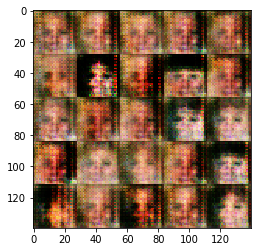


 Epoch 1/1 Step 7600 Discriminator Loss: 1.5050 ...  Generator Loss: 0.7100

 Epoch 1/1 Step 7610 Discriminator Loss: 1.6476 ...  Generator Loss: 0.6904

 Epoch 1/1 Step 7620 Discriminator Loss: 1.7822 ...  Generator Loss: 0.5547

 Epoch 1/1 Step 7630 Discriminator Loss: 1.6883 ...  Generator Loss: 0.6157

 Epoch 1/1 Step 7640 Discriminator Loss: 1.4129 ...  Generator Loss: 0.7138

 Epoch 1/1 Step 7650 Discriminator Loss: 1.3479 ...  Generator Loss: 0.7312

 Epoch 1/1 Step 7660 Discriminator Loss: 1.6266 ...  Generator Loss: 0.6046

 Epoch 1/1 Step 7670 Discriminator Loss: 1.6064 ...  Generator Loss: 0.6455

 Epoch 1/1 Step 7680 Discriminator Loss: 1.5051 ...  Generator Loss: 0.5759

 Epoch 1/1 Step 7690 Discriminator Loss: 1.6697 ...  Generator Loss: 0.5371


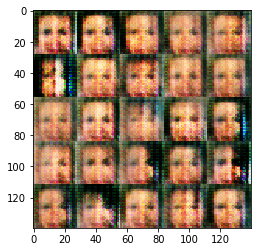


 Epoch 1/1 Step 7700 Discriminator Loss: 1.3933 ...  Generator Loss: 0.7138

 Epoch 1/1 Step 7710 Discriminator Loss: 1.4828 ...  Generator Loss: 0.6053

 Epoch 1/1 Step 7720 Discriminator Loss: 1.6434 ...  Generator Loss: 0.6463

 Epoch 1/1 Step 7730 Discriminator Loss: 1.4471 ...  Generator Loss: 0.7219

 Epoch 1/1 Step 7740 Discriminator Loss: 1.6279 ...  Generator Loss: 0.5801

 Epoch 1/1 Step 7750 Discriminator Loss: 1.3638 ...  Generator Loss: 0.6896

 Epoch 1/1 Step 7760 Discriminator Loss: 1.2446 ...  Generator Loss: 0.8360

 Epoch 1/1 Step 7770 Discriminator Loss: 1.6199 ...  Generator Loss: 0.5849

 Epoch 1/1 Step 7780 Discriminator Loss: 1.5707 ...  Generator Loss: 0.6109

 Epoch 1/1 Step 7790 Discriminator Loss: 1.5627 ...  Generator Loss: 0.7009


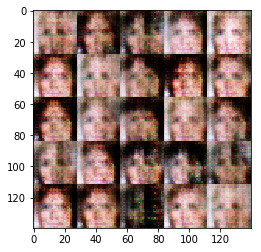


 Epoch 1/1 Step 7800 Discriminator Loss: 1.6826 ...  Generator Loss: 0.5684

 Epoch 1/1 Step 7810 Discriminator Loss: 1.6093 ...  Generator Loss: 0.6678

 Epoch 1/1 Step 7820 Discriminator Loss: 1.4887 ...  Generator Loss: 0.7657

 Epoch 1/1 Step 7830 Discriminator Loss: 1.4153 ...  Generator Loss: 0.6663

 Epoch 1/1 Step 7840 Discriminator Loss: 1.6636 ...  Generator Loss: 0.6226

 Epoch 1/1 Step 7850 Discriminator Loss: 1.5283 ...  Generator Loss: 0.6492

 Epoch 1/1 Step 7860 Discriminator Loss: 1.4616 ...  Generator Loss: 0.6683

 Epoch 1/1 Step 7870 Discriminator Loss: 1.5085 ...  Generator Loss: 0.6694

 Epoch 1/1 Step 7880 Discriminator Loss: 1.4633 ...  Generator Loss: 0.8708

 Epoch 1/1 Step 7890 Discriminator Loss: 1.4523 ...  Generator Loss: 0.7305


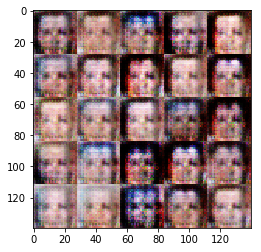


 Epoch 1/1 Step 7900 Discriminator Loss: 1.3837 ...  Generator Loss: 0.7294

 Epoch 1/1 Step 7910 Discriminator Loss: 1.6450 ...  Generator Loss: 0.6739

 Epoch 1/1 Step 7920 Discriminator Loss: 1.4874 ...  Generator Loss: 0.6943

 Epoch 1/1 Step 7930 Discriminator Loss: 1.4451 ...  Generator Loss: 0.7488

 Epoch 1/1 Step 7940 Discriminator Loss: 1.4738 ...  Generator Loss: 0.6027

 Epoch 1/1 Step 7950 Discriminator Loss: 1.7753 ...  Generator Loss: 0.4765

 Epoch 1/1 Step 7960 Discriminator Loss: 1.4897 ...  Generator Loss: 0.6587

 Epoch 1/1 Step 7970 Discriminator Loss: 1.4745 ...  Generator Loss: 0.6194

 Epoch 1/1 Step 7980 Discriminator Loss: 1.4242 ...  Generator Loss: 0.8582

 Epoch 1/1 Step 7990 Discriminator Loss: 1.5628 ...  Generator Loss: 0.5891


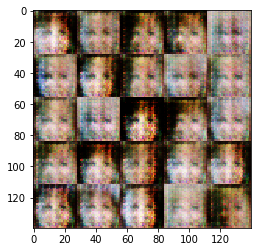


 Epoch 1/1 Step 8000 Discriminator Loss: 1.3877 ...  Generator Loss: 0.6703

 Epoch 1/1 Step 8010 Discriminator Loss: 1.3154 ...  Generator Loss: 0.8657

 Epoch 1/1 Step 8020 Discriminator Loss: 1.6640 ...  Generator Loss: 0.5676

 Epoch 1/1 Step 8030 Discriminator Loss: 1.5671 ...  Generator Loss: 0.6421

 Epoch 1/1 Step 8040 Discriminator Loss: 1.6004 ...  Generator Loss: 0.5919

 Epoch 1/1 Step 8050 Discriminator Loss: 1.3516 ...  Generator Loss: 0.9064

 Epoch 1/1 Step 8060 Discriminator Loss: 1.5675 ...  Generator Loss: 0.6289

 Epoch 1/1 Step 8070 Discriminator Loss: 1.2868 ...  Generator Loss: 0.8661

 Epoch 1/1 Step 8080 Discriminator Loss: 1.6249 ...  Generator Loss: 0.6949

 Epoch 1/1 Step 8090 Discriminator Loss: 1.4237 ...  Generator Loss: 0.7486


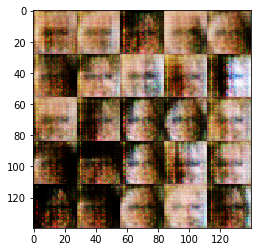


 Epoch 1/1 Step 8100 Discriminator Loss: 1.4954 ...  Generator Loss: 0.6800

 Epoch 1/1 Step 8110 Discriminator Loss: 1.3027 ...  Generator Loss: 0.8001

 Epoch 1/1 Step 8120 Discriminator Loss: 1.4254 ...  Generator Loss: 0.7305

 Epoch 1/1 Step 8130 Discriminator Loss: 1.2303 ...  Generator Loss: 0.8711

 Epoch 1/1 Step 8140 Discriminator Loss: 1.5766 ...  Generator Loss: 0.7860

 Epoch 1/1 Step 8150 Discriminator Loss: 1.4155 ...  Generator Loss: 0.6544

 Epoch 1/1 Step 8160 Discriminator Loss: 1.4524 ...  Generator Loss: 0.7125

 Epoch 1/1 Step 8170 Discriminator Loss: 1.7009 ...  Generator Loss: 0.5971

 Epoch 1/1 Step 8180 Discriminator Loss: 1.5045 ...  Generator Loss: 0.6768

 Epoch 1/1 Step 8190 Discriminator Loss: 1.3501 ...  Generator Loss: 0.6829


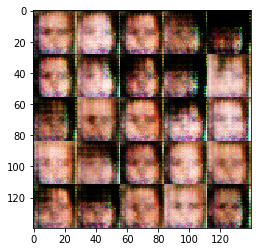


 Epoch 1/1 Step 8200 Discriminator Loss: 1.4844 ...  Generator Loss: 0.7101

 Epoch 1/1 Step 8210 Discriminator Loss: 1.4243 ...  Generator Loss: 0.7175

 Epoch 1/1 Step 8220 Discriminator Loss: 1.4938 ...  Generator Loss: 0.6888

 Epoch 1/1 Step 8230 Discriminator Loss: 1.3564 ...  Generator Loss: 0.7312

 Epoch 1/1 Step 8240 Discriminator Loss: 1.5830 ...  Generator Loss: 0.6327

 Epoch 1/1 Step 8250 Discriminator Loss: 1.3007 ...  Generator Loss: 0.7696

 Epoch 1/1 Step 8260 Discriminator Loss: 1.5283 ...  Generator Loss: 0.7117

 Epoch 1/1 Step 8270 Discriminator Loss: 1.3985 ...  Generator Loss: 0.8226

 Epoch 1/1 Step 8280 Discriminator Loss: 1.4017 ...  Generator Loss: 0.7233

 Epoch 1/1 Step 8290 Discriminator Loss: 1.5556 ...  Generator Loss: 0.6162


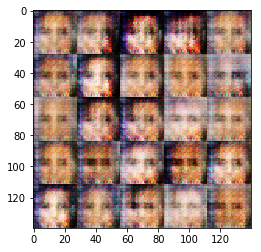


 Epoch 1/1 Step 8300 Discriminator Loss: 1.3846 ...  Generator Loss: 0.8431

 Epoch 1/1 Step 8310 Discriminator Loss: 1.3578 ...  Generator Loss: 0.8861

 Epoch 1/1 Step 8320 Discriminator Loss: 1.2962 ...  Generator Loss: 0.7847

 Epoch 1/1 Step 8330 Discriminator Loss: 1.5387 ...  Generator Loss: 0.7042

 Epoch 1/1 Step 8340 Discriminator Loss: 1.5345 ...  Generator Loss: 0.7649

 Epoch 1/1 Step 8350 Discriminator Loss: 1.3648 ...  Generator Loss: 0.7572

 Epoch 1/1 Step 8360 Discriminator Loss: 1.4947 ...  Generator Loss: 0.6744

 Epoch 1/1 Step 8370 Discriminator Loss: 1.5565 ...  Generator Loss: 0.6801

 Epoch 1/1 Step 8380 Discriminator Loss: 1.5400 ...  Generator Loss: 0.7046

 Epoch 1/1 Step 8390 Discriminator Loss: 1.5121 ...  Generator Loss: 0.6743


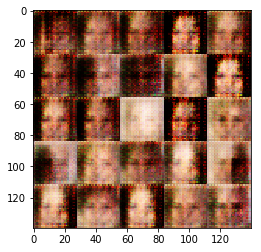


 Epoch 1/1 Step 8400 Discriminator Loss: 1.6431 ...  Generator Loss: 0.6503

 Epoch 1/1 Step 8410 Discriminator Loss: 1.5065 ...  Generator Loss: 0.6722

 Epoch 1/1 Step 8420 Discriminator Loss: 1.7491 ...  Generator Loss: 0.4993

 Epoch 1/1 Step 8430 Discriminator Loss: 1.5923 ...  Generator Loss: 0.6728

 Epoch 1/1 Step 8440 Discriminator Loss: 1.3460 ...  Generator Loss: 0.8171

 Epoch 1/1 Step 8450 Discriminator Loss: 1.4829 ...  Generator Loss: 0.5388

 Epoch 1/1 Step 8460 Discriminator Loss: 1.5861 ...  Generator Loss: 0.6337

 Epoch 1/1 Step 8470 Discriminator Loss: 1.5211 ...  Generator Loss: 0.6151

 Epoch 1/1 Step 8480 Discriminator Loss: 1.3519 ...  Generator Loss: 0.7897

 Epoch 1/1 Step 8490 Discriminator Loss: 1.6592 ...  Generator Loss: 0.6414


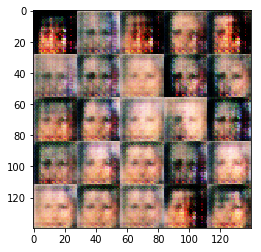


 Epoch 1/1 Step 8500 Discriminator Loss: 1.6525 ...  Generator Loss: 0.6356

 Epoch 1/1 Step 8510 Discriminator Loss: 1.3967 ...  Generator Loss: 0.7789

 Epoch 1/1 Step 8520 Discriminator Loss: 1.5003 ...  Generator Loss: 0.7279

 Epoch 1/1 Step 8530 Discriminator Loss: 1.4789 ...  Generator Loss: 0.6868

 Epoch 1/1 Step 8540 Discriminator Loss: 1.4868 ...  Generator Loss: 0.6439

 Epoch 1/1 Step 8550 Discriminator Loss: 1.5142 ...  Generator Loss: 0.6322

 Epoch 1/1 Step 8560 Discriminator Loss: 1.5869 ...  Generator Loss: 0.5932

 Epoch 1/1 Step 8570 Discriminator Loss: 1.6358 ...  Generator Loss: 0.5921

 Epoch 1/1 Step 8580 Discriminator Loss: 1.5338 ...  Generator Loss: 0.6032

 Epoch 1/1 Step 8590 Discriminator Loss: 1.6403 ...  Generator Loss: 0.6031


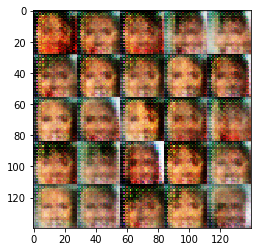


 Epoch 1/1 Step 8600 Discriminator Loss: 1.5320 ...  Generator Loss: 0.6638

 Epoch 1/1 Step 8610 Discriminator Loss: 1.4296 ...  Generator Loss: 0.7138

 Epoch 1/1 Step 8620 Discriminator Loss: 1.4363 ...  Generator Loss: 0.6605

 Epoch 1/1 Step 8630 Discriminator Loss: 1.4905 ...  Generator Loss: 0.7688

 Epoch 1/1 Step 8640 Discriminator Loss: 1.5390 ...  Generator Loss: 0.7354

 Epoch 1/1 Step 8650 Discriminator Loss: 1.6378 ...  Generator Loss: 0.5806

 Epoch 1/1 Step 8660 Discriminator Loss: 1.5998 ...  Generator Loss: 0.6496

 Epoch 1/1 Step 8670 Discriminator Loss: 1.3736 ...  Generator Loss: 0.7530

 Epoch 1/1 Step 8680 Discriminator Loss: 1.6346 ...  Generator Loss: 0.6443

 Epoch 1/1 Step 8690 Discriminator Loss: 1.7256 ...  Generator Loss: 0.6026


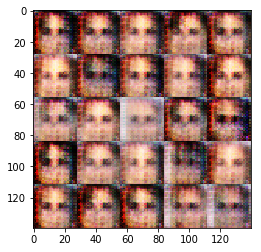


 Epoch 1/1 Step 8700 Discriminator Loss: 1.3615 ...  Generator Loss: 0.7509

 Epoch 1/1 Step 8710 Discriminator Loss: 1.4243 ...  Generator Loss: 0.6497

 Epoch 1/1 Step 8720 Discriminator Loss: 1.6159 ...  Generator Loss: 0.6827

 Epoch 1/1 Step 8730 Discriminator Loss: 1.4565 ...  Generator Loss: 0.6289

 Epoch 1/1 Step 8740 Discriminator Loss: 1.6606 ...  Generator Loss: 0.6109

 Epoch 1/1 Step 8750 Discriminator Loss: 1.6227 ...  Generator Loss: 0.5998

 Epoch 1/1 Step 8760 Discriminator Loss: 1.5000 ...  Generator Loss: 0.6319

 Epoch 1/1 Step 8770 Discriminator Loss: 1.7296 ...  Generator Loss: 0.5118

 Epoch 1/1 Step 8780 Discriminator Loss: 1.5917 ...  Generator Loss: 0.7060

 Epoch 1/1 Step 8790 Discriminator Loss: 1.5017 ...  Generator Loss: 0.6558


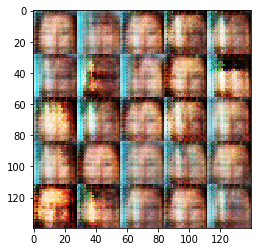


 Epoch 1/1 Step 8800 Discriminator Loss: 1.3693 ...  Generator Loss: 0.8702

 Epoch 1/1 Step 8810 Discriminator Loss: 1.5136 ...  Generator Loss: 0.5946

 Epoch 1/1 Step 8820 Discriminator Loss: 1.7564 ...  Generator Loss: 0.6151

 Epoch 1/1 Step 8830 Discriminator Loss: 1.6747 ...  Generator Loss: 0.6424

 Epoch 1/1 Step 8840 Discriminator Loss: 1.3915 ...  Generator Loss: 0.7737

 Epoch 1/1 Step 8850 Discriminator Loss: 1.6459 ...  Generator Loss: 0.6350

 Epoch 1/1 Step 8860 Discriminator Loss: 1.3995 ...  Generator Loss: 0.7950

 Epoch 1/1 Step 8870 Discriminator Loss: 1.3817 ...  Generator Loss: 0.7774

 Epoch 1/1 Step 8880 Discriminator Loss: 1.7409 ...  Generator Loss: 0.5343

 Epoch 1/1 Step 8890 Discriminator Loss: 1.4294 ...  Generator Loss: 0.7202


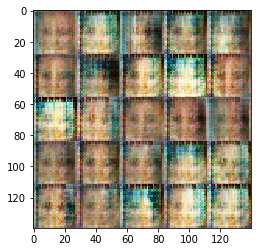


 Epoch 1/1 Step 8900 Discriminator Loss: 1.4402 ...  Generator Loss: 0.7376

 Epoch 1/1 Step 8910 Discriminator Loss: 1.6048 ...  Generator Loss: 0.6321

 Epoch 1/1 Step 8920 Discriminator Loss: 1.5069 ...  Generator Loss: 0.7464

 Epoch 1/1 Step 8930 Discriminator Loss: 1.6102 ...  Generator Loss: 0.7244

 Epoch 1/1 Step 8940 Discriminator Loss: 1.3688 ...  Generator Loss: 0.7136

 Epoch 1/1 Step 8950 Discriminator Loss: 1.5189 ...  Generator Loss: 0.6336

 Epoch 1/1 Step 8960 Discriminator Loss: 1.5004 ...  Generator Loss: 0.8419

 Epoch 1/1 Step 8970 Discriminator Loss: 1.6160 ...  Generator Loss: 0.6130

 Epoch 1/1 Step 8980 Discriminator Loss: 1.5169 ...  Generator Loss: 0.6635

 Epoch 1/1 Step 8990 Discriminator Loss: 1.5438 ...  Generator Loss: 0.7506


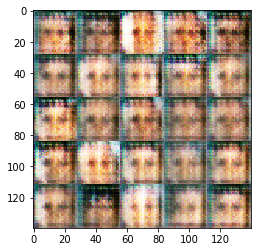


 Epoch 1/1 Step 9000 Discriminator Loss: 1.3600 ...  Generator Loss: 0.6581

 Epoch 1/1 Step 9010 Discriminator Loss: 1.5761 ...  Generator Loss: 0.6336

 Epoch 1/1 Step 9020 Discriminator Loss: 1.5958 ...  Generator Loss: 0.7872

 Epoch 1/1 Step 9030 Discriminator Loss: 1.4790 ...  Generator Loss: 0.7438

 Epoch 1/1 Step 9040 Discriminator Loss: 1.6164 ...  Generator Loss: 0.6674

 Epoch 1/1 Step 9050 Discriminator Loss: 1.7758 ...  Generator Loss: 0.6545

 Epoch 1/1 Step 9060 Discriminator Loss: 1.4427 ...  Generator Loss: 0.7384

 Epoch 1/1 Step 9070 Discriminator Loss: 1.4915 ...  Generator Loss: 0.6555

 Epoch 1/1 Step 9080 Discriminator Loss: 1.3414 ...  Generator Loss: 0.8230

 Epoch 1/1 Step 9090 Discriminator Loss: 1.7087 ...  Generator Loss: 0.6556


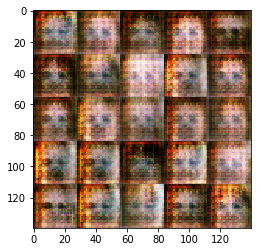


 Epoch 1/1 Step 9100 Discriminator Loss: 1.6097 ...  Generator Loss: 0.5473

 Epoch 1/1 Step 9110 Discriminator Loss: 1.3176 ...  Generator Loss: 0.8381

 Epoch 1/1 Step 9120 Discriminator Loss: 1.2877 ...  Generator Loss: 0.7626

 Epoch 1/1 Step 9130 Discriminator Loss: 1.5746 ...  Generator Loss: 0.5989

 Epoch 1/1 Step 9140 Discriminator Loss: 1.4175 ...  Generator Loss: 0.6675

 Epoch 1/1 Step 9150 Discriminator Loss: 1.4257 ...  Generator Loss: 0.8252

 Epoch 1/1 Step 9160 Discriminator Loss: 1.4810 ...  Generator Loss: 0.7206

 Epoch 1/1 Step 9170 Discriminator Loss: 1.6141 ...  Generator Loss: 0.6323

 Epoch 1/1 Step 9180 Discriminator Loss: 1.4258 ...  Generator Loss: 0.6714

 Epoch 1/1 Step 9190 Discriminator Loss: 1.5292 ...  Generator Loss: 0.6171


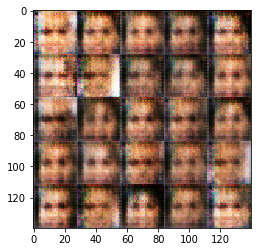


 Epoch 1/1 Step 9200 Discriminator Loss: 1.6071 ...  Generator Loss: 0.5815

 Epoch 1/1 Step 9210 Discriminator Loss: 1.5855 ...  Generator Loss: 0.6530

 Epoch 1/1 Step 9220 Discriminator Loss: 1.3977 ...  Generator Loss: 0.7715

 Epoch 1/1 Step 9230 Discriminator Loss: 1.5072 ...  Generator Loss: 0.7308

 Epoch 1/1 Step 9240 Discriminator Loss: 1.4168 ...  Generator Loss: 0.8365

 Epoch 1/1 Step 9250 Discriminator Loss: 1.7458 ...  Generator Loss: 0.5797

 Epoch 1/1 Step 9260 Discriminator Loss: 1.5081 ...  Generator Loss: 0.7027

 Epoch 1/1 Step 9270 Discriminator Loss: 1.5282 ...  Generator Loss: 0.6773

 Epoch 1/1 Step 9280 Discriminator Loss: 1.5360 ...  Generator Loss: 0.6165

 Epoch 1/1 Step 9290 Discriminator Loss: 1.5431 ...  Generator Loss: 0.8013


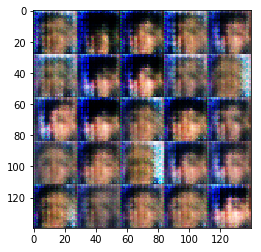


 Epoch 1/1 Step 9300 Discriminator Loss: 1.2150 ...  Generator Loss: 0.8405

 Epoch 1/1 Step 9310 Discriminator Loss: 1.3749 ...  Generator Loss: 0.7463

 Epoch 1/1 Step 9320 Discriminator Loss: 1.4082 ...  Generator Loss: 0.7175

 Epoch 1/1 Step 9330 Discriminator Loss: 1.3491 ...  Generator Loss: 0.7788

 Epoch 1/1 Step 9340 Discriminator Loss: 1.2868 ...  Generator Loss: 0.8005

 Epoch 1/1 Step 9350 Discriminator Loss: 1.4972 ...  Generator Loss: 0.7142

 Epoch 1/1 Step 9360 Discriminator Loss: 1.4750 ...  Generator Loss: 0.7137

 Epoch 1/1 Step 9370 Discriminator Loss: 1.5181 ...  Generator Loss: 0.7277

 Epoch 1/1 Step 9380 Discriminator Loss: 1.5052 ...  Generator Loss: 0.6615

 Epoch 1/1 Step 9390 Discriminator Loss: 1.5731 ...  Generator Loss: 0.6319


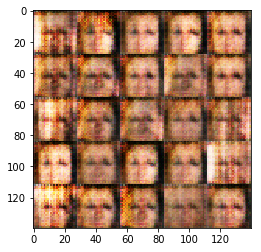


 Epoch 1/1 Step 9400 Discriminator Loss: 1.6021 ...  Generator Loss: 0.6291


KeyboardInterrupt: 

In [58]:
batch_size = 16
z_dim = 128
learning_rate = .0002
beta1 = .25


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.